<a href="https://colab.research.google.com/github/couzhei/chicago-crime/blob/main/chicago_crime.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Requirements and Collection

## Importing the required packages

In [ ]:
import os, sys, math, io # some basic built-in packages
import pickle # a package for saving models and parameters
import time, datetime # working with time and datetime
import numpy as np # matrix manipulation
import statsmodels.api as sm # statistical testing
import pandas as pd # preprocessing and dataframe manipulation
import random # working with random
!pip install -Uqqq chart_studio # using plotly service
import plotly.graph_objects as go # plotly
import plotly.express as px # another light-weighted version of plotly
import gc  # for force-garbage collecting
!pip install -Uqqq geopandas # to work with geo-spatial datasets
import geopandas as gpd # see above
import folium as fo # working with geospatial visualization
import matplotlib.pyplot as plt # data visualization
import seaborn as sns # data visualization
import matplotlib.cm as cm # colormap for prettier visualization
from scipy.ndimage.filters import gaussian_filter
import matplotlib.image as mpimg # working with image right into data visualization
import matplotlib as mpl # data visualization
!pip install -Uqqq sodapy # using Socrata API for updating dataset
from sodapy import Socrata
# from google.cloud import bigquery  # if you happen to not have the dataset locally
from pandas.plotting import scatter_matrix # for creating pearson's r correlation heatmap
from sklearn.model_selection import train_test_split # creating train and test sets
from tqdm import tqdm # having a progress bar in the notebook
from IPython.core.display import display, HTML # for creating html components such as tables

## DEPENDING ON WHAT MACHINE YOU'RE ON AND WHAT ACCOUNT YOU HAVE 
MyAppToken = "..." # For Socrata API
USER = "..." # For Socrata API
PASS = "..." # For Socrata API
TRAIN_PATH = "chicago_crime.csv"
IMAGES_PATH = "images/"
GEO_PATH = 'miscdata/'
MODELS_AND_PARAMS_PATH = "savedModelsnParams/chicago/" # For models progress

## PLEASE UNCOMMENT THE FOLLOWING IF YOU WISH TO UPLOAD ALL THE MISC
## FILES INTO THIS WORKING ENVIRONMENT
# !git clone https://www.github.com/couzhei/chicago-crime.git
# !mv chicago-crime/* .

## PLEASE UNCOMMENT THE FOLLOWING IF YOU WISH TO HAVE YOUR GOOGLE DRIVE AS
## CHECKPOINTS!
# from google.colab import drive # connecting to and mounting google drive
# drive.mount('/content/gdrive')

Mounted at /content/gdrive


## Replicating Results on Each Session

In [ ]:
SEED = 42

def seed_everything(seed):
    random.seed(seed)
    np.random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
seed_everything(SEED)

## Socrata API for Chicago Crime

If this is your first time running this notebook, you should be first downloading the whole dataset of chicago crime in your working place (which is next subsection), then the following will update the existing data for you:

In [ ]:
# !cp gdrive/MyDrive/chicago_crime.csv . # to have a backup

#### Updating the Dataset to the Latest

In [ ]:
# These are the columns and their corresponding dtypes we're interested!

dtypes = {
    # "Beat": "int16",
    # "Community Area": "int8",
    # "District": "int8",
    # "Ward": "int8",
}  # these won't work due to the so-called safe-rule 
# of converting types in pandas (Bull-fucking-shit!)
# To circumvent this, we might be using chunks of dataframes and apply these
# compression technique on each chunk and then stack them together

selected_cols = pd.Index(['ID', 'Case Number', 'Date', 'Block', 'IUCR', 
                          'Primary Type', 'Description', 'Location Description',
                          'Arrest', 'Domestic', 'Beat', 'District', 'Ward', 
                          'Community Area', 'FBI Code', 'X Coordinate',
                          'Y Coordinate', 'Year', 'Updated On', 'Latitude', 
                          'Longitude', 'Location'], dtype='object')

# First we check what is the last record in our existing dataset:

# Tracking the time
t0 = time.time()

with open(TRAIN_PATH) as f:
    first_line = f.readline()
    for line in f:
        pass #iterate to the end
    last_line = line

previous_data = pd.DataFrame(
    columns=list(pd.read_csv(
        io.StringIO(first_line), 
        header=0)))
previous_data = previous_data.append(
    pd.read_csv(io.StringIO(last_line), 
                names=previous_data.columns)
    )

# See what we have loaded
last_updated_id = previous_data.ID[0]
print("Last record ID is ", last_updated_id)
print("Time elapsed:", 
      time.strftime("%H:%M:%S",time.gmtime(time.time() - t0)))



## -------------------------------------------------------------- ##
# Now we update our dataframe using Socrata API:

LIMIT = 10_000
t0 = time.time()

# Authenticated client (needed for non-public datasets):
client = Socrata("data.cityofchicago.org",
                    MyAppToken,
                    username=USER,
                    password=PASS)

while True:

    results = client.get("ijzp-q8t2", limit = LIMIT)

    # Convert to pandas DataFrame
    results_df = pd.DataFrame.from_records(results)
    new_cols_name = results_df.columns.to_list()
    new_cols_name[:len(selected_cols)] = selected_cols.to_list()
    results_df.columns = new_cols_name

    # This not a good idea!
    # # Converting variables' dtypes
    # results_df["ID"] = results_df.ID.astype("uint32")
    # results_df[["Community Area", "Ward", "District"]] = results_df[
    #                                                               ["Community Area", 
    #                                                                "Ward", 
    #                                                                "District"]].fillna(value=0)
    # results_df["Community Area"] = results_df["Community Area"].astype("int8")
    # results_df["Ward"] = results_df["Ward"].astype("int8")
    # results_df["District"] = results_df["District"].astype("int8")
    # results_df["Beat"] = results_df["Beat"].astype("int16")
    # results_df["Year"] = results_df["Year"].astype("int16")
    # results_df.Date = pd.to_datetime(results_df.Date)
    
    if results_df.iloc[0,:].ID == str(last_updated_id):
        print("Dataset is already in its latest form!")
        break
    
    if results_df.ID.isin([str(last_updated_id)]).any():
        starting_index = results_df[
                                    results_df.ID == str(last_updated_id)
                                    ].index[0]
        
        # starting from the newest up to to last record we already got
        # taking only first 22 columns and not more
        difference_data = results_df.loc[:starting_index - 1, results_df.columns[:22]]
        # reversing the order, since Socrata takes data from latest to the earlier
        difference_data = difference_data.reindex(index=difference_data.index[::-1])
        difference_data.to_csv(TRAIN_PATH, mode='a', 
                               index=False, header=False)
        print("Dataset has been successfully updated to the latest!")
        break
    else:
        LIMIT *= 10
        continue

print("Time elapsed:", 
      time.strftime("%H:%M:%S",time.gmtime(time.time() - t0)))

Last record ID is  12693202
Time elapsed: 00:00:07
Dataset is already in its latest form!
Time elapsed: 00:00:09


In [ ]:
results_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Longitude,Location,:@computed_region_awaf_s7ux,:@computed_region_6mkv_f3dw,:@computed_region_vrxf_vc4k,:@computed_region_bdys_3d7i,:@computed_region_43wa_7qmu,:@computed_region_rpca_8um6,:@computed_region_d9mm_jgwp,:@computed_region_d3ds_rm58
0,12693202,JF235239,2022-05-08T23:59:00.000,058XX W MADISON ST,051A,ASSAULT,AGGRAVATED - HANDGUN,STREET,False,False,...,-87.770170439,"{'latitude': '41.880161534', 'longitude': '-87...",52,22216,26,618,7,32,25,99
1,26753,JF234930,2022-05-08T23:57:00.000,021XX W MAYPOLE AVE,0110,HOMICIDE,FIRST DEGREE MURDER,HOUSE,False,False,...,-87.679989354,"{'latitude': '41.883931984', 'longitude': '-87...",48,21184,29,37,46,28,15,75
2,12693042,JF235024,2022-05-08T23:55:00.000,073XX S CLAREMONT AVE,0486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,False,True,...,-87.68180248,"{'latitude': '41.760260616', 'longitude': '-87...",6,22257,64,333,30,23,13,226
3,12693120,JF235035,2022-05-08T23:51:00.000,006XX N KEDZIE AVE,0460,BATTERY,SIMPLE,APARTMENT,False,False,...,-87.706472369,"{'latitude': '41.892745919', 'longitude': '-87...",41,21184,24,177,46,30,16,65
4,12693027,JF235048,2022-05-08T23:50:00.000,110XX S AVENUE H,1320,CRIMINAL DAMAGE,TO VEHICLE,STREET,False,False,...,-87.532869615,"{'latitude': '41.694693798', 'longitude': '-87...",47,21202,49,552,47,25,19,259


In [ ]:
previous_data

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,12658540,JF193151,2022-03-31T23:48:00.000,057XX W IRVING PARK RD,486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE - PORCH / HALLWAY,False,True,...,38,15,08B,1137468,1926017,2022,2022-04-07T16:47:34.000,41.953138,-87.770058,"{'latitude': '41.953138391', 'longitude': '-87..."


What are these?

In [ ]:
results_df[[":@computed_region_awaf_s7ux", ":@computed_region_6mkv_f3dw", ":@computed_region_vrxf_vc4k", ":@computed_region_bdys_3d7i",
            ":@computed_region_43wa_7qmu", ":@computed_region_rpca_8um6", ":@computed_region_d9mm_jgwp", ":@computed_region_d3ds_rm58"]]

,:@computed_region_awaf_s7ux,:@computed_region_6mkv_f3dw,:@computed_region_vrxf_vc4k,:@computed_region_bdys_3d7i,:@computed_region_43wa_7qmu,:@computed_region_rpca_8um6,:@computed_region_d9mm_jgwp,:@computed_region_d3ds_rm58
0,52,22216,26,618,7,32,25,99
1,48,21184,29,37,46,28,15,75
2,6,22257,64,333,30,23,13,226
3,41,21184,24,177,46,30,16,65
4,47,21202,49,552,47,25,19,259
...,...,...,...,...,...,...,...,...
9995,14,21569,32,146,28,57,21,166
9996,28,21849,14,750,20,20,1,48
9997,7,22615,19,305,17,2,6,176
9998,9,21202,42,507,35,25,19,240


## Directly Getting the Dataset

Alternatively, you can download the whole thing altogether into a single .csv file below:

In [ ]:
# !wget -O chicago_crime.csv "https://data.cityofchicago.org/api/views/ijzp-q8t2/rows.csv?accessType=DOWNLOAD"

--2022-03-05 07:41:08--  https://data.cityofchicago.org/api/views/ijzp-q8t2/rows.csv?accessType=DOWNLOAD
Resolving data.cityofchicago.org (data.cityofchicago.org)... 52.206.140.199, 52.206.140.205, 52.206.68.26
Connecting to data.cityofchicago.org (data.cityofchicago.org)|52.206.140.199|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘chicago_crime.csv’

chicago_crime.csv       [                 <=>]  11.35M  3.11MB/s               ^C


Run the following cells, <font color="purple">only if you're sure </font> that the current .csv file must be gone!

In [ ]:
# !rm gdrive/MyDrive/chicago_crime.csv

In [ ]:
# renaming it to a proper label
# !mv 'rows.csv?accessType=DOWNLOAD' gdrive/MyDrive/chicago_crime.csv

In [ ]:
# peep into the csv file
df_tmp = pd.read_csv(TRAIN_PATH, nrows=5)
df_tmp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ID                    5 non-null      int64  
 1   Case Number           5 non-null      object 
 2   Date                  5 non-null      object 
 3   Block                 5 non-null      object 
 4   IUCR                  5 non-null      int64  
 5   Primary Type          5 non-null      object 
 6   Description           5 non-null      object 
 7   Location Description  5 non-null      object 
 8   Arrest                5 non-null      bool   
 9   Domestic              5 non-null      bool   
 10  Beat                  5 non-null      int64  
 11  District              5 non-null      int64  
 12  Ward                  5 non-null      int64  
 13  Community Area        5 non-null      int64  
 14  FBI Code              5 non-null      object 
 15  X Coordinate          4 non

## Miscellaneous Tools and Functions

Created as the background picture needed for the city of chicago map:

In [ ]:
# !pip install basemap
# !pip install basemap-data-hires
# from mpl_toolkits.basemap import Basemap

# # llcrnrlat,llcrnrlon,urcrnrlat,urcrnrlon
# # are the lat/lon values of the lower left and upper right corners
# # of the map.
# # lat_ts is the latitude of true scale.
# # resolution = 'c' means use crude resolution coastlines. (must be one of 'c','l','i','h' or 'f')
# m = Basemap(projection='merc',llcrnrlat=41.6,urcrnrlat=42.09,\
#             llcrnrlon=-88,urcrnrlon=-87.4,lat_ts=0,resolution='h')
# plt.figure(figsize=(10,10))
# m.drawcoastlines()
# m.shadedrelief()
# m.drawstates()
# m.drawrivers()
# m.fillcontinents(color='coral',lake_color='lightblue')
# # draw parallels and meridians.
# # m.drawparallels(np.arange(-90.,91.,30.))
# # m.drawmeridians(np.arange(-180.,181.,60.))
# # m.drawmapboundary(fill_color='aqua')
# # plt.title("Mercator Projection")
# plt.savefig('chicago.png',bbox_inches='tight');

#### Performance Showing and Saving

#### Model Saving

#### Treemap

#### Haversine

#### OTHERS

<a href="#bitch">[Start modeling now!](#bitch)</a>



In [ ]:
TRAIN_PATH = "gdrive/MyDrive/chicago_crime.csv"
IMAGES_PATH = "gdrive/MyDrive/images"
GEO_PATH = '/content/gdrive/MyDrive/miscdata/'

In [ ]:
# peep into the csv file
df_tmp = pd.read_csv(TRAIN_PATH, nrows=5)
df_tmp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   ID                    5 non-null      int64  
 1   Case Number           5 non-null      object 
 2   Date                  5 non-null      object 
 3   Block                 5 non-null      object 
 4   IUCR                  5 non-null      int64  
 5   Primary Type          5 non-null      object 
 6   Description           5 non-null      object 
 7   Location Description  5 non-null      object 
 8   Arrest                5 non-null      bool   
 9   Domestic              5 non-null      bool   
 10  Beat                  5 non-null      int64  
 11  District              5 non-null      int64  
 12  Ward                  5 non-null      int64  
 13  Community Area        5 non-null      int64  
 14  FBI Code              5 non-null      object 
 15  X Coordinate          4 non

In [ ]:
df_tmp.head(3)

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,10224738,HY411648,09/05/2015 01:30:00 PM,043XX S WOOD ST,486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,False,True,...,12,61,08B,1165074.0,1875917.0,2015,02/10/2018 03:50:01 PM,41.815117,-87.6700,"(41.815117282, -87.669999562)"
1,10224739,HY411615,09/04/2015 11:30:00 AM,008XX N CENTRAL AVE,870,THEFT,POCKET-PICKING,CTA BUS,False,False,...,29,25,06,1138875.0,1904869.0,2015,02/10/2018 03:50:01 PM,41.895080,-87.7654,"(41.895080471, -87.765400451)"
2,11646166,JC213529,09/01/2018 12:01:00 AM,082XX S INGLESIDE AVE,810,THEFT,OVER $500,RESIDENCE,False,True,...,8,44,06,NaN,NaN,2018,04/06/2019 04:04:43 PM,NaN,NaN,NaN


## Getting the Data

In [ ]:
dtypes = {
    # "Beat": "int16",
    # "Community Area": "int8",
    # "District": "int8",
    # "Ward": "int8",
}  # these won't work due to the so-called safe-rule of converting types in pandas (Bull-fucking-shit!)
# To circumvent this, we might be using chunks of dataframes and apply these
# compression technique on each chunk and then stack them together

selected_cols = [
                 "Case Number", "Date", "Block", "IUCR", "Primary Type",
                 "Description", "Location Description", "Arrest", "Domestic",
                 "Beat", "District", "Ward", "Community Area", "FBI Code",
                 "Latitude", "Longitude", "Year", "Updated On",
] # Did I remove those column, objectively?

In [ ]:
# # READING FILE ALL TOGEHTER
# t0 = time.time() # just counting how much cell is going to run, starting from t0 (now)
# # df = pd.read_csv("https://data.cityofchicago.org/api/views/ijzp-q8t2/rows.csv?accessType=DOWNLOAD")
# df = pd.read_csv(TRAIN_PATH, dtype=dtypes, usecols=selected_cols)
# # df.to_csv("gdrive/MyDrive/chicago_crime_20220125.csv", index=False)
# print("Time elapsed:", time.strftime("%H:%M:%S",time.gmtime(time.time() - t0)))

In [ ]:
# READING BY CHUNKS OF DATA
t0 = time.time()

chunksize = 2_000_000 # 2 million rows at one go. Or try 10 million?

df_list = [] # list to hold the batch dataframe

for df_chunk in pd.read_csv(TRAIN_PATH, 
                            dtype=dtypes,
                            usecols=selected_cols,
                            chunksize=chunksize): 

    # df_chunk.dropna(inplace=True) # might be a good idea after all

    df_chunk[["Community Area", "Ward", "District"]]=df_chunk[[
                                                               "Community Area", 
                                                               "Ward", 
                                                               "District"]
                                                              ].fillna(value=0)
    df_chunk["Community Area"] = df_chunk["Community Area"].astype("int8")
    df_chunk["Ward"] = df_chunk["Ward"].astype("int8")
    df_chunk["District"] = df_chunk["District"].astype("int8")
    df_chunk["Beat"] = df_chunk["Beat"].astype("int16")
    df_chunk["Year"] = df_chunk["Year"].astype("int16")
    df_chunk.Date = pd.to_datetime(df_chunk.Date)

    # Alternatively, append the chunk to list and merge all
    df_list.append(df_chunk) 

del df_chunk
print("Number of chunks:", len(df_list))

# Merge all dataframes into one dataframe
df = pd.concat(df_list)

# Delete the dataframe list to release memory
del df_list

# See what we have loaded
print("Time elapsed:", time.strftime("%H:%M:%S",time.gmtime(time.time() - t0)))

Number of chunks: 4
Time elapsed: 00:11:41


The above cell took almost 12 minutes, for taking all the columns with 4 chunks of `.csv` file!

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7522327 entries, 0 to 7522326
Data columns (total 18 columns):
 #   Column                Dtype         
---  ------                -----         
 0   Case Number           object        
 1   Date                  datetime64[ns]
 2   Block                 object        
 3   IUCR                  object        
 4   Primary Type          object        
 5   Description           object        
 6   Location Description  object        
 7   Arrest                bool          
 8   Domestic              bool          
 9   Beat                  int16         
 10  District              int8          
 11  Ward                  int8          
 12  Community Area        int8          
 13  FBI Code              object        
 14  Year                  int16         
 15  Updated On            object        
 16  Latitude              float64       
 17  Longitude             float64       
dtypes: bool(2), datetime64[ns](1), float64(2),

In [ ]:
df.head(3)

,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,Year,Updated On,Latitude,Longitude
0,HY411648,2015-09-05 13:30:00,043XX S WOOD ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,False,True,924,9,12,61,08B,2015,02/10/2018 03:50:01 PM,41.815117,-87.6700
1,HY411615,2015-09-04 11:30:00,008XX N CENTRAL AVE,0870,THEFT,POCKET-PICKING,CTA BUS,False,False,1511,15,29,25,06,2015,02/10/2018 03:50:01 PM,41.895080,-87.7654
2,JC213529,2018-09-01 00:01:00,082XX S INGLESIDE AVE,0810,THEFT,OVER $500,RESIDENCE,False,True,631,6,8,44,06,2018,04/06/2019 04:04:43 PM,NaN,NaN


In [ ]:
df.describe()

,Beat,District,Ward,Community Area,Year,Latitude,Longitude
count,7.496025e+06,7.496025e+06,7.496025e+06,7.496025e+06,7.496025e+06,7.418928e+06,7.418928e+06
mean,1.187183e+03,1.129435e+01,2.086499e+01,3.446125e+01,2.009472e+03,4.184207e+01,-8.767160e+01
std,7.029550e+02,6.948056e+00,1.465103e+01,2.306267e+01,5.888061e+00,8.880244e-02,6.108915e-02
min,1.110000e+02,0.000000e+00,0.000000e+00,0.000000e+00,2.001000e+03,3.661945e+01,-9.168657e+01
25%,6.210000e+02,6.000000e+00,7.000000e+00,1.900000e+01,2.004000e+03,4.176871e+01,-8.771378e+01
50%,1.034000e+03,1.000000e+01,2.000000e+01,2.900000e+01,2.009000e+03,4.185578e+01,-8.766593e+01
75%,1.731000e+03,1.700000e+01,3.200000e+01,5.300000e+01,2.014000e+03,4.190670e+01,-8.762823e+01
max,2.535000e+03,3.100000e+01,5.000000e+01,7.700000e+01,2.022000e+03,4.202291e+01,-8.752453e+01


The following took ~30s

In [ ]:
df.describe(include="object")

,Case Number,Block,IUCR,Primary Type,Description,Location Description,FBI Code,Updated On
count,7496021,7496025,7496025,7496025,7496025,7487014,7496025,7496025
unique,7495158,62012,403,36,539,214,26,4735
top,HJ590004,100XX W OHARE ST,0820,THEFT,SIMPLE,STREET,06,02/10/2018 03:50:01 PM
freq,6,16062,609266,1577698,881220,1944259,1577698,2788198


In [ ]:
df.Beat.min(), df.Beat.max()

(111, 2535)

## Checking For Errors



### Checking Duplicates

In [ ]:
%%time
df_duplicated_by_case = df[df.duplicated(['Case Number'], keep=False)]

CPU times: user 7.44 s, sys: 42 ms, total: 7.48 s
Wall time: 7.44 s


In [ ]:
df_duplicated_by_case

,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,Year,Updated On,Latitude,Longitude
238597,G540323,2001-09-08 03:56:00,005XX E 89 PLACE,0110,HOMICIDE,FIRST DEGREE MURDER,AUTO,True,False,633,6,0,0,01A,2001,03/19/2019 04:11:22 PM,41.731990,-87.610929
244578,G540323,2001-09-08 03:56:00,005XX E 89 PLACE,0110,HOMICIDE,FIRST DEGREE MURDER,AUTO,True,False,633,6,0,0,01A,2001,03/19/2019 04:11:22 PM,41.731990,-87.610929
646657,G592219,2001-10-03 01:03:00,016XX W 44 ST,0110,HOMICIDE,FIRST DEGREE MURDER,APARTMENT,True,True,914,9,0,0,01A,2001,03/19/2019 04:11:22 PM,41.814042,-87.666816
654078,G592219,2001-10-03 01:03:00,016XX W 44 ST.,0110,HOMICIDE,FIRST DEGREE MURDER,APARTMENT,True,True,914,9,0,0,01A,2001,03/19/2019 04:11:22 PM,41.814042,-87.666816
661101,G592219,2001-10-03 01:03:00,016XX W 44 ST.,0110,HOMICIDE,FIRST DEGREE MURDER,APARTMENT,True,True,914,9,0,0,01A,2001,03/19/2019 04:11:22 PM,41.814042,-87.666816
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7517358,JF198311,2022-04-05 15:45:00,113XX S GREEN ST,0110,HOMICIDE,FIRST DEGREE MURDER,HOUSE,False,False,2234,22,34,75,01A,2022,2022-04-12T16:52:57.000,41.688105,-87.643459
7517921,JE361773,2022-04-06 17:11:00,014XX S KOLIN AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,False,False,1011,10,24,29,01A,2022,2022-04-13T16:50:48.000,41.861941,-87.733612
7518563,JD413965,2022-04-07 19:40:00,028XX E 78TH ST,0110,HOMICIDE,FIRST DEGREE MURDER,ALLEY,False,True,421,4,7,43,01A,2022,2022-04-14T16:51:58.000,41.753694,-87.554943
7520263,JF203921,2022-04-10 23:20:00,010XX W MONTROSE AVE,0110,HOMICIDE,FIRST DEGREE MURDER,APARTMENT,True,True,1913,19,46,3,01A,2022,2022-04-17T16:51:01.000,41.961759,-87.655958


check duplicated HOMICIDE!

In [ ]:
df_duplicated_by_case["Primary Type"].value_counts()

HOMICIDE                             912
THEFT                                163
BATTERY                              147
ASSAULT                               93
CRIMINAL DAMAGE                       79
MOTOR VEHICLE THEFT                   50
WEAPONS VIOLATION                     39
OTHER OFFENSE                         37
ROBBERY                               37
NARCOTICS                             32
DECEPTIVE PRACTICE                    22
CRIMINAL TRESPASS                     18
BURGLARY                              17
OFFENSE INVOLVING CHILDREN             8
PUBLIC PEACE VIOLATION                 6
INTERFERENCE WITH PUBLIC OFFICER       4
PROSTITUTION                           2
CONCEALED CARRY LICENSE VIOLATION      2
Name: Primary Type, dtype: int64

In [ ]:
df_duplicated_by_case.shape[0]/ df.shape[0]

0.00022173989511490262

In [ ]:
df_duplicated_by_case[df_duplicated_by_case["Primary Type"] == "HOMICIDE"]

,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,Year,Updated On,Latitude,Longitude
238597,G540323,2001-09-08 03:56:00,005XX E 89 PLACE,0110,HOMICIDE,FIRST DEGREE MURDER,AUTO,True,False,633,6,0,0,01A,2001,03/19/2019 04:11:22 PM,41.731990,-87.610929
244578,G540323,2001-09-08 03:56:00,005XX E 89 PLACE,0110,HOMICIDE,FIRST DEGREE MURDER,AUTO,True,False,633,6,0,0,01A,2001,03/19/2019 04:11:22 PM,41.731990,-87.610929
646657,G592219,2001-10-03 01:03:00,016XX W 44 ST,0110,HOMICIDE,FIRST DEGREE MURDER,APARTMENT,True,True,914,9,0,0,01A,2001,03/19/2019 04:11:22 PM,41.814042,-87.666816
654078,G592219,2001-10-03 01:03:00,016XX W 44 ST.,0110,HOMICIDE,FIRST DEGREE MURDER,APARTMENT,True,True,914,9,0,0,01A,2001,03/19/2019 04:11:22 PM,41.814042,-87.666816
661101,G592219,2001-10-03 01:03:00,016XX W 44 ST.,0110,HOMICIDE,FIRST DEGREE MURDER,APARTMENT,True,True,914,9,0,0,01A,2001,03/19/2019 04:11:22 PM,41.814042,-87.666816
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7489926,JF142607,2022-02-12 18:48:00,059XX S WASHTENAW AVE,0110,HOMICIDE,FIRST DEGREE MURDER,ALLEY,False,False,824,8,16,66,01A,2022,2022-02-19T15:49:23.000,41.785750,-87.691137
7489938,JF142615,2022-02-12 19:06:00,024XX W MARQUETTE RD,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,False,False,832,8,16,66,01A,2022,2022-02-19T15:49:23.000,41.771967,-87.684096
7490549,JF138013,2022-02-15 07:10:00,073XX S EMERALD AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,False,False,732,7,6,68,01A,2022,2022-02-22T15:54:22.000,41.760718,-87.643078
7494189,JF152198,2022-02-22 09:12:00,049XX S MARSHFIELD AVE,0110,HOMICIDE,FIRST DEGREE MURDER,APARTMENT,True,False,931,9,20,61,01A,2022,2022-03-01T15:51:28.000,41.804200,-87.666074


In [ ]:
df_duplicated_by_case[df_duplicated_by_case["Primary Type"] == "HOMICIDE"]["Description"].value_counts()

FIRST DEGREE MURDER    897
Name: Description, dtype: int64

All of which were `"FIRST DEGREE MURDER"`.

In [101]:
%%time
df_duplicated_by_case = df[df.duplicated(['Case Number'], keep=False)]

KeyError: ignored

These are the number of duplicated rows considering `Case Number`:

In [99]:
df_duplicated_by_case.shape[0]

930

This by itself might be telling a fascinating story! Or there's actually nothing significant about it. Either way, as math people say, without loss of generality(this is certainly wrong, since we're in a countable world, i.e. infinitely limited compared to the math world) we just drop those, keep the most recent ones(`Updated On`). I postpone the double checking of "making sure the most recent entries are kept".

In [ ]:
%%time
df.drop_duplicates(subset="Case Number", keep="last", inplace=True)

## Proper Formatting

### Adding Additional Columns about `datetime`

In [ ]:
# converting datetime to additional feature regarding day, month, day of the week, etc.
df["Month"] = df.Date.dt.month
df["Day"] = df.Date.dt.day
df["Year"] = df.Date.dt.year
df["Hour"] = df.Date.dt.hour

Making missing data`s obvious to the machine, might be patterns in that respect, somehow:

In [ ]:
df.loc[df['Description'].isnull()==True,'Description'] = 'Undefined'
df.loc[df['Location Description'].isnull()==True,'Location Description'] = 'Undefined'
df.loc[df['Primary Type'].isnull()==True,'Primary Type'] = 'Undefined'

In [ ]:
df.drop(['Updated On', 'Case Number'], axis=1, inplace=True) # doesn't seem important 

In [ ]:
df[["Month", "Day", "Hour"]] = df[["Month", "Day", "Hour"]].astype("int8")
df["Year"] = df.Year.astype("int16")
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7495159 entries, 0 to 7496024
Data columns (total 19 columns):
 #   Column                Dtype         
---  ------                -----         
 0   Date                  datetime64[ns]
 1   Block                 object        
 2   IUCR                  object        
 3   Primary Type          object        
 4   Description           object        
 5   Location Description  object        
 6   Arrest                bool          
 7   Domestic              bool          
 8   Beat                  int16         
 9   District              int8          
 10  Ward                  int8          
 11  Community Area        int8          
 12  FBI Code              object        
 13  Year                  int16         
 14  Latitude              float64       
 15  Longitude             float64       
 16  Month                 int8          
 17  Day                   int8          
 18  Hour                  int8          
dtype

In [ ]:
print(*df.Month.unique())
print(*df.Day.unique())
print(*df.Hour.unique())

9 5 7 3 2 8 1 4 10 12 6 11
5 4 1 3 8 2 27 30 25 17 31 24 7 18 29 13 20 6 21 28 9 26 10 15 22 16 14 11 19 12 23
13 11 0 12 10 18 14 3 9 22 15 21 8 6 16 20 23 7 19 17 1 5 2 4


# Data Understanding and Exploration

In [ ]:
print("There are",df.District.nunique(),"unique police districts in the dataset.")

There are 25 unique police districts in the dataset.


The elapsed time in the following is not considering the time required for rendering the matplotlib figure:

Time elapsed: 00:00:25


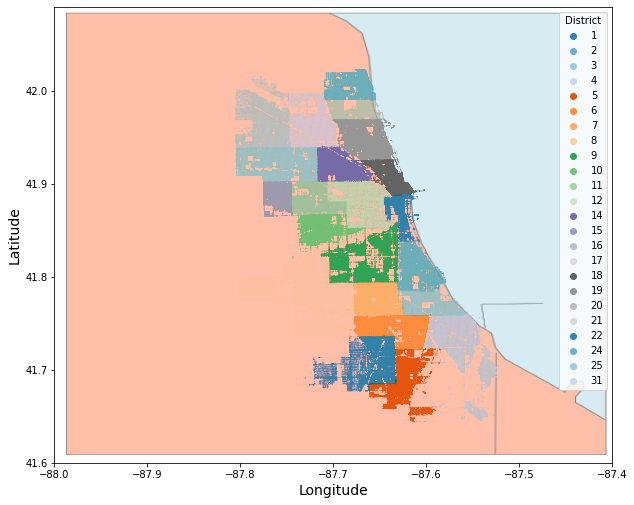

In [ ]:
# tracking the time needed to run this cell
t0 = time.time()

# the reason that I limit the latitude and longitude is that
# after peeking earlier into this dataset, I found out some
# locations are outside of the city of Chicago, so I exclude
# those out of this dataset, naming it df_new
df_new = df.loc[(df.Latitude < 42.03)&(41.64 < df.Latitude)&\
                (df.Longitude < -87.52)&(-87.805 < df.Longitude)
                &(df.District != 0)]

chicago_img=mpimg.imread(os.path.join(IMAGES_PATH, "chicago.png"))
plt.figure(figsize=(10,10))
plt.imshow(chicago_img, extent=[-88, -87.4, 41.6, 42.09], alpha=0.5,
           cmap=plt.get_cmap("jet"))
plt.ylabel("Latitude", fontsize=14)
plt.xlabel("Longitude", fontsize=14)


# checking the distribution of places in the 2d plain
sns.scatterplot(x=df_new.Longitude, y=df_new.Latitude, 
                hue="District", palette='tab20c',
                alpha=.1, s=.5, linewidth=0, data=df_new);
print("Time elapsed:", time.strftime("%H:%M:%S",time.gmtime(time.time() - t0)))

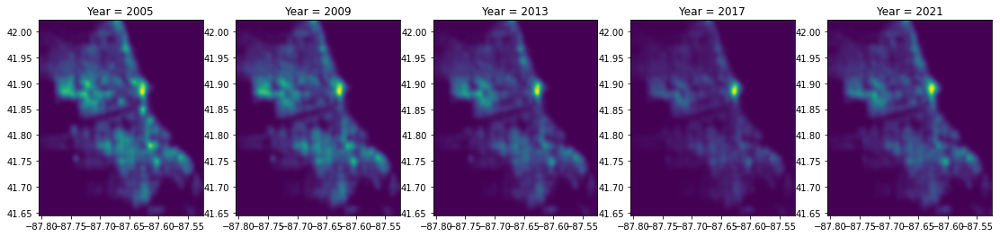

In [ ]:
# creating a function to plot heatmap on geographical data
def myplot(x, y, s, bins=1000):
    heatmap, xedges, yedges = np.histogram2d(x, y, bins=bins)
    heatmap = gaussian_filter(heatmap, sigma=s)

    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    return heatmap.T, extent




YEARS = [2005, 2009, 2013, 2017, 2021]
sigma = 14


fig, axs = plt.subplots(1, 5, figsize=(19,4))
for ax, year in zip(axs.flatten(), YEARS):
    x = df_new[df_new.Year == year].Longitude
    y = df_new[df_new.Year == year].Latitude
    img, extent = myplot(x, y, sigma)
    ax.imshow(img, extent=extent, origin='lower', 
              aspect='auto', cmap='viridis')
    ax.set_title(f"Year = {year}")

plt.show()

In [ ]:
df["Primary Type"].value_counts()

THEFT                                1577616
BATTERY                              1374961
CRIMINAL DAMAGE                       854557
NARCOTICS                             740881
ASSAULT                               482715
OTHER OFFENSE                         466101
BURGLARY                              415632
MOTOR VEHICLE THEFT                   346971
DECEPTIVE PRACTICE                    323968
ROBBERY                               281938
CRIMINAL TRESPASS                     209147
WEAPONS VIOLATION                      96112
PROSTITUTION                           69513
OFFENSE INVOLVING CHILDREN             53038
PUBLIC PEACE VIOLATION                 51441
SEX OFFENSE                            29069
CRIM SEXUAL ASSAULT                    27784
INTERFERENCE WITH PUBLIC OFFICER       17865
LIQUOR LAW VIOLATION                   14651
GAMBLING                               14607
ARSON                                  12737
HOMICIDE                               11261
KIDNAPPING

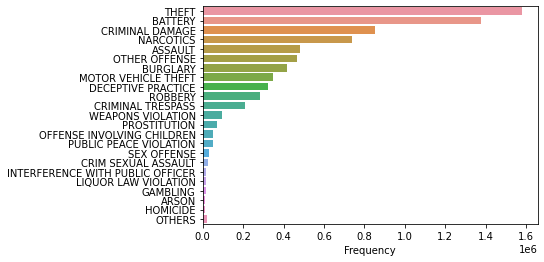

In [ ]:
primary_types = df["Primary Type"].value_counts()
num_of_others = primary_types[~(primary_types > 10000)].sum()
primary_types = pd.concat([
                           primary_types[primary_types > 10000],
                           pd.Series([num_of_others], index=["OTHERS"])
                           ])
plt.xlabel("Frequency")
sns.barplot(x=primary_types.values, y=primary_types.index);

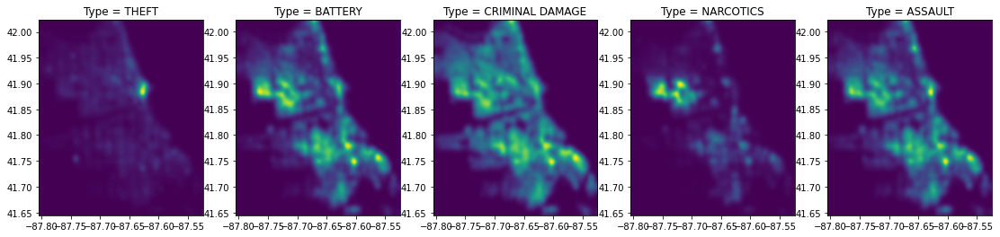

In [ ]:
top5_types = df_new["Primary Type"].value_counts()[:6].index.tolist()

fig, axs = plt.subplots(1, 5, figsize=(19,4))
for ax, crime_type in zip(axs.flatten(), top5_types):
    x = df_new[(df_new["Primary Type"] == crime_type)].Longitude
    y = df_new[df_new["Primary Type"] == crime_type].Latitude
    img, extent = myplot(x, y, sigma)
    ax.imshow(img, extent=extent, origin='lower', 
              aspect='auto', cmap='viridis')
    ax.set_title(f"Type = {crime_type}")

plt.show()

## Descriptive Analytics

In [ ]:
df.columns

Index(['ID', 'Date', 'Block', 'IUCR', 'Primary Type', 'Description',
       'Location Description', 'Arrest', 'Domestic', 'Beat', 'District',
       'Ward', 'Community Area', 'FBI Code', 'X Coordinate', 'Y Coordinate',
       'Year', 'Latitude', 'Longitude', 'Location', 'Month', 'Day', 'Hour'],
      dtype='object')

In [ ]:
# attributes=["Latitude", "Longitude"]
# scatter_matrix(df.sample(frac=0.1)[attributes], figsize=(12, 8));

Something wrong! outliers obviously!

Our numerical columns, and their corresponding statistcs:



In [ ]:
(df.describe()).T

The three four statistics means meaningless at this time, about Year? Hmm not very sure about it! Latitude and Longitude might be better watched over a plot or histogram or geographically, other variables aren't that informative either. We might be observing them through different tools and angles. Now our categorical columns, and their corresponding statistcs:
:

In [ ]:
df.describe(include="object").T

,count,unique,top,freq
Block,7495159,62010,100XX W OHARE ST,16061
IUCR,7495159,403,0820,609237
Primary Type,7495159,36,THEFT,1577616
Description,7495159,539,SIMPLE,881169
Location Description,7495159,215,STREET,1943966
FBI Code,7495159,26,06,1577616


Unlike our numerical variables, our categorical ones shows more sense to us, crimes most happen in the street, the most frequent description is `"SIMPLE"` and FBI Code might be better to be coded like Beat to a number. And `"100XX W OHARE ST"` with `16033` frequency is the most active place of blocks apparently:

In [102]:
Number_crimes = df.loc[~df.Arrest, 'Primary Type'].value_counts()
values = Number_crimes.values
categories = pd.DataFrame(data=Number_crimes.index, columns=["Primary Type"])
categories['values'] = values

gyr = ['#FF003C', '#FD2F14', '#F86127', '#F38C3B', '#F1A652',
       '#EFC961', '#ECDC70', '#E4E980', '#CFE688', '#C0E38F',
       '#B6DB98', '#AAD09A', '#A1C79B', '#99B99B', '#8EA493',
       "#808D86", "#666C6A"][::-1]

fig = px.treemap(categories, path=['Primary Type'], values=values, height=400,
                 title='Major Crimes in Chicago', 
                 color_discrete_sequence = gyr
                 )
fig.data[0].textinfo = 'label+text+value'
fig.update_layout(
margin=dict(l=0,r=0,b=0,t=0),
paper_bgcolor="white"
)
fig.show()
    

In [103]:
Number_crimes = df.loc[df.Arrest, 'Primary Type'].value_counts()
values = Number_crimes.values
categories = pd.DataFrame(data=Number_crimes.index, columns=["Primary Type"])
categories['values'] = values


fig = px.treemap(categories, path=['Primary Type'], values=values, height=400,
                 title='Major Crimes in Chicago', 
                 color_discrete_sequence = gyr
                 )
fig.data[0].textinfo = 'label+text+value'
fig.update_layout(
margin=dict(l=0,r=0,b=0,t=0),
paper_bgcolor="white"
)
fig.show()

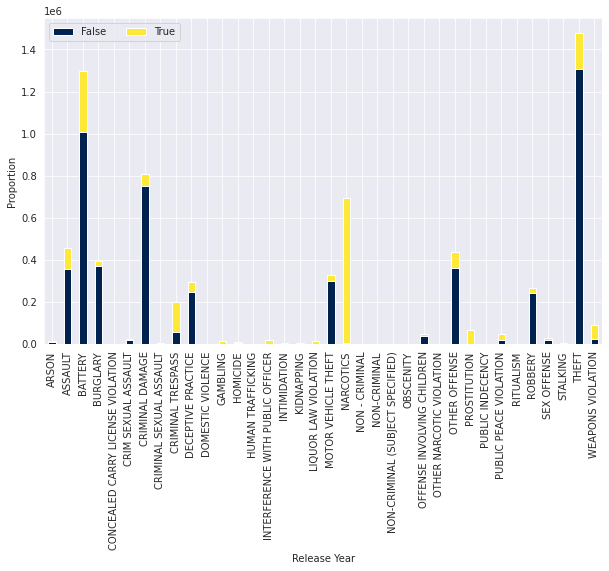

In [ ]:
cross_tab = pd.crosstab(index=df['Arrest'],
                        columns=df['Primary Type'])
cross_tab.T.plot(kind='bar', 
                    stacked=True, 
                    colormap='cividis', 
                    figsize=(10, 6))

sns.set_style("darkgrid")
plt.xticks(rotation=90)
plt.legend(loc="upper left", ncol=2, )
plt.xlabel("Release Year")
plt.ylabel("Proportion");

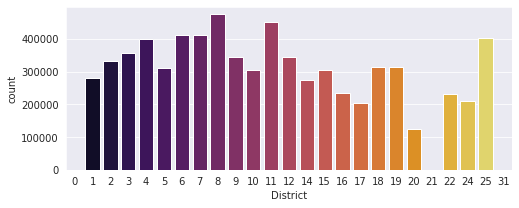

In [ ]:
f = plt.figure(figsize=(8, 3))
sns.set_style("darkgrid")
sns.countplot(x=df["District"], palette='inferno');

In [ ]:
df[df.District == 31]

,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,Year,Latitude,Longitude,Month,Day,Hour
2310,2015-09-04 10:40:00,024XX W 71ST ST,1200,DECEPTIVE PRACTICE,STOLEN PROP: BUY/RECEIVE/POS.,SMALL RETAIL STORE,True,False,832,31,17,66,13,2015,41.764690,-87.683722,9,4,10
10950,2015-09-16 10:30:00,024XX W 71ST ST,1200,DECEPTIVE PRACTICE,STOLEN PROP: BUY/RECEIVE/POS.,SMALL RETAIL STORE,True,False,832,31,17,66,13,2015,41.764690,-87.683722,9,16,10
99405,2015-08-28 10:00:00,024XX W 71ST ST,1200,DECEPTIVE PRACTICE,STOLEN PROP: BUY/RECEIVE/POS.,SMALL RETAIL STORE,True,False,832,31,17,66,13,2015,41.764690,-87.683722,8,28,10
102706,2015-09-01 10:40:00,024XX W 71ST ST,1200,DECEPTIVE PRACTICE,STOLEN PROP: BUY/RECEIVE/POS.,SMALL RETAIL STORE,True,False,832,31,17,66,13,2015,41.764690,-87.683722,9,1,10
121301,2015-12-23 10:16:00,071XX S STATE ST,1130,DECEPTIVE PRACTICE,FRAUD OR CONFIDENCE GAME,GROCERY FOOD STORE,False,False,323,31,6,69,11,2015,41.764144,-87.624879,12,23,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7440821,2021-10-23 03:33:00,109XX W HIGGINS RD,0454,BATTERY,"AGGRAVATED P.O. - HANDS, FISTS, FEET, NO / MIN...",GAS STATION,True,False,1654,31,41,76,08B,2021,42.003002,-87.894202,10,23,3
7465590,2021-12-28 07:00:00,005XX W OHARE ST,0820,THEFT,$500 AND UNDER,AIRPORT BUILDING NON-TERMINAL - SECURE AREA,False,False,1653,31,41,76,06,2021,41.965057,-87.879953,12,28,7
7468959,2017-07-10 00:01:00,054XX S ARCHER AVE,1752,OFFENSE INVOLVING CHILDREN,AGGRAVATED CRIMINAL SEXUAL ABUSE BY FAMILY MEMBER,HOTEL / MOTEL,False,False,814,31,23,56,17,2017,41.968013,-87.818796,7,10,0
7493165,2022-02-20 07:40:00,0000X W OHARE ST,1350,CRIMINAL TRESPASS,TO STATE SUP LAND,AIRPORT TERMINAL LOWER LEVEL - NON-SECURE AREA,True,False,1654,31,41,76,26,2022,41.996235,-87.939733,2,20,7


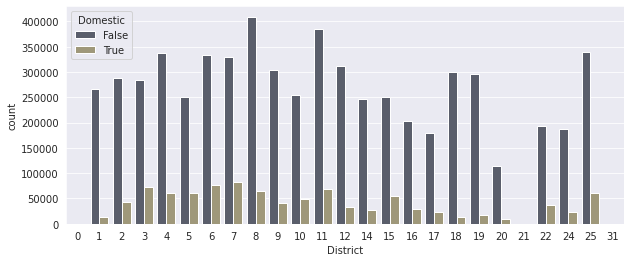

In [ ]:
# Police
sns.set_style("darkgrid")
plt.figure(figsize=(10, 4))
sns.countplot(x="District", data=df, hue="Domestic", palette='cividis');

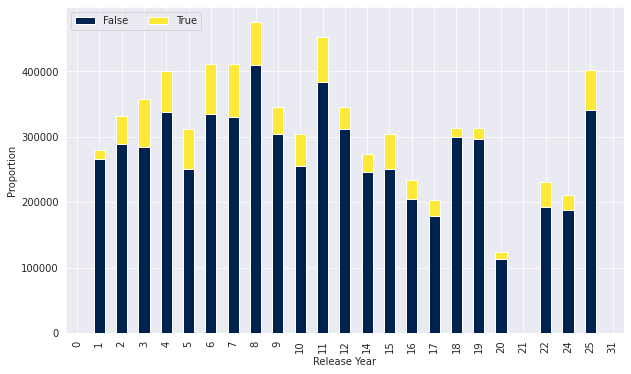

In [ ]:
sns.set_style("darkgrid")
cross_tab = pd.crosstab(index=df['Domestic'],
                        columns=df['District'])
cross_tab.T.plot(kind='bar', 
                    stacked=True, 
                    colormap='cividis', 
                    figsize=(10, 6))

plt.xticks(rotation=90)
plt.legend(loc="upper left",
           labels=["Nonviolent", "Violent"], ncol=2)
plt.xlabel("Release Year")
plt.ylabel("Proportion");

0 probably means some error in collection of those records, while 21 is interestingly likely to be around 0! let's check what's going on there:




In [ ]:
df[df.District == 21].shape[0]

4

Only 4 crimes in that District? Where is this place, heaven?

In [ ]:
district_12 = df[df.District == 21]

In [105]:
district_12.head()

,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,Year,Latitude,Longitude,Month,Day,Hour
2289330,2003-07-20 00:05:00,031XX S INDIANA AVE,0890,THEFT,FROM BUILDING,OTHER,False,False,2112,21,3,35,06,2003,41.837901,-87.621915,7,20,0
2527786,2004-02-18 18:15:00,031XX S INDIANA AVE,0420,BATTERY,AGGRAVATED:KNIFE/CUTTING INSTR,SIDEWALK,False,False,2112,21,3,35,04B,2004,41.837901,-87.621915,2,18,18
2722608,2004-07-04 15:45:48,031XX S INDIANA AVE,2024,NARCOTICS,POSS: HEROIN(WHITE),STREET,True,False,2112,21,3,35,18,2004,41.837901,-87.621915,7,4,15
2754229,2004-08-01 20:05:00,031XX S INDIANA AVE,0486,BATTERY,DOMESTIC BATTERY SIMPLE,VEHICLE NON-COMMERCIAL,True,True,2112,21,3,35,08B,2004,41.837901,-87.621915,8,1,20


Interestingly, all of them happened in the block `"031XX S INDIANA AVE"`. Looking at it on the map:

In [104]:
district_12["Latitude"]

2289330    41.837901
2527786    41.837901
2722608    41.837901
2754229    41.837901
Name: Latitude, dtype: float64

In [ ]:
map = fo.Map(location=[district_12.Latitude.mean(), 
                 district_12.Longitude.mean()], 
       zoom_start=15, control_scale=True)
for i in range(district_12.shape[0]):
    fo.Marker(location = [district_12["Latitude"].values[i], 
                        district_12["Longitude"].values[i]], 
            popup=district_12["Primary Type"].values[i]).add_to(map)

map

ACCESS TOKEN for MAPBOX API:

In [106]:
!echo 'pk.eyJ1IjoiY291emhlaSIsImEiOiJja3oxMTd4ZGYxaHJrMm9teG82cWpsc29qIn0.egqOkvoOdROBwUA9sMs0ig' > layout.mapbox.access_token

In [107]:
import plotly.express as px

## A rather interesting chart is the crimes related to prostitution 
## throughout Chicago. We can see here that related crimes appear to 
## be in distinctive line patterns, most likely representing various 
## streets throughout the city. Please do compare "PROSTITUTION" type 
## of crimes in 2014 to 2020(the Lockdown year), it turns out all the
## crimes of this type turns out to be an arrested one 2020 onwards

CRIME_TYPE = "PROSTITUTION"
YEAR = 2020

plot_data = df[df["Primary Type"] == CRIME_TYPE]
plot_data = plot_data[plot_data.Date.dt.year == YEAR]

px.set_mapbox_access_token(open("layout.mapbox.access_token").read())

fig = px.scatter_mapbox(plot_data,
                        lat=plot_data.Latitude,
                        lon=plot_data.Longitude,
                        hover_name="Date",
                        color="Arrest",
                        zoom=10
                        )

fig.update_layout(
    margin=dict(l=0,r=0,b=0,t=0),
    paper_bgcolor="Gray"
    )
# fig.save()
fig.show()

In [108]:
t0 = time.time()

YEAR = 2015
if YEAR:
  plot_data = df[(df.Date.dt.year == YEAR) & (df.District != 0)]
else:
  plot_data = df.copy()
district_crime = plot_data['District'].value_counts(ascending=False)
## Reset index and name the district and crime count columns
district_crime.index = district_crime.index.astype(str)
district_crime = district_crime.reset_index()
district_crime.columns = ['District', 'Count']

# creation of the choropleth
district_map = fo.Map(location=[plot_data['Latitude'].mean(), 
                                plot_data['Longitude'].mean()], 
                      zoom_start=10,
                      # height=400,
                      # width=450,
                      # max_zoom=10,
                      # min_zoom=10,
                      )
max_value = district_crime.iloc[0, 1]
num_digits = len(str(max_value)) - 1
MAX_THRESHOLD = math.ceil(max_value/10**num_digits) * 10 ** num_digits
threshold_scale = list(np.linspace(0,MAX_THRESHOLD,6))

cp = fo.Choropleth(
              geo_data=os.path.join(GEO_PATH, "police-dsitricts.geojson"),
              name='Choropleth',
              data = district_crime,
              threshold_scale=threshold_scale,
              columns = ['District', 'Count'], # columns to be used from our data
              key_on = 'feature.properties.dist_num', # matching elements from the `geojson` data
              fill_color = 'YlOrBr', # main colour scheme
              fill_opacity = 0.7, # main colour scheme opacity
              line_opacity = 0.2, # borders opacity
              legend_name = 'Number of crimes per police district',
              nan_fill_color="white", # missing values color
              nan_fill_opacity=1, # missing values opacity
              highlight=True, # `mouse on` highliht feature for each country
              ).add_to(district_map)

# hover functionality

# creating a state indexed version of the dataframe so we can lookup values
district_data_indexed = district_crime.set_index('District')

# looping thru the geojson object and adding a new property(unemployment)
# and assigning a value from our dataframe
for s in cp.geojson.data['features']:
    s['properties']['num_crimes'] = int(district_data_indexed.loc[s['properties']['dist_num'], 'Count'])

# and finally adding a tooltip/hover to the choropleth's geojson
fo.GeoJsonTooltip(fields=['dist_num', 'num_crimes'],
                  labels=True,
                  aliases=["District:", "Crimes:"]).add_to(cp.geojson)

district_map.save("Crime-per-district-choropleth.html")

print("Time elapsed:", time.strftime("%H:%M:%S",time.gmtime(time.time() - t0)))
district_map

Time elapsed: 00:00:01


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7490070 entries, 0 to 7490069
Data columns (total 18 columns):
 #   Column                Dtype         
---  ------                -----         
 0   Case Number           object        
 1   Date                  datetime64[ns]
 2   Block                 object        
 3   IUCR                  object        
 4   Primary Type          object        
 5   Description           object        
 6   Location Description  object        
 7   Arrest                bool          
 8   Domestic              bool          
 9   Beat                  int16         
 10  District              int8          
 11  Ward                  int8          
 12  Community Area        int8          
 13  FBI Code              object        
 14  Year                  int16         
 15  Updated On            object        
 16  Latitude              float64       
 17  Longitude             float64       
dtypes: bool(2), datetime64[ns](1), float64(2),

See this [reference](https://towardsdatascience.com/folium-and-choropleth-map-from-zero-to-pro-6127f9e68564) to learn about building choropleth visualization.

In [109]:
t0 = time.time()

YEAR = 2015
if YEAR:
  plot_data = df[(df.Date.dt.year == YEAR) & (df.Beat != 0)]
else:
  plot_data = df.copy()
beat_crime = plot_data['Beat'].value_counts(ascending=False)
## Reset index and name the district and crime count columns
beat_crime.index = beat_crime.index.astype(str).str.zfill(4)
beat_crime = beat_crime.reset_index()
beat_crime.columns = ['Beat', 'Count']

# creation of the choropleth
beat_map = fo.Map(location=[plot_data['Latitude'].mean(), 
                            plot_data['Longitude'].mean()], 
                            # height=400,
                            # width=450,
                            zoom_start=10)

max_value = beat_crime.iloc[0, 1]
num_digits = len(str(max_value)) - 1
MAX_THRESHOLD = math.ceil(max_value/10**num_digits) * 10 ** num_digits
threshold_scale = list(np.linspace(0,MAX_THRESHOLD,6))

cp = fo.Choropleth(
              geo_data=os.path.join(GEO_PATH, "beats.geojson"),
              name='Choropleth',
              data = beat_crime,
              threshold_scale = threshold_scale,
              columns = ['Beat', 'Count'], # columns to be used from our data
              key_on = 'feature.properties.beat_num', # matching elements from the `geojson` data
              fill_color = 'YlOrBr', # main colour scheme
              fill_opacity = 0.7, # main colour scheme opacity
              line_opacity = 0.2, # borders opacity
              legend_name = 'Number of crimes per police beat',
              nan_fill_color="gray", # missing values color
              nan_fill_opacity=1, # missing values opacity
              highlight=True, # `mouse on` highliht feature for each country
              # tooltip=fo.Tooltip("test", permanent=False),
              # tooltip=fo.features.GeoJsonTooltip(fields=['feature.properties.dist_num'],
              #                                    aliases=['Police Beat:'],)
              ).add_to(beat_map)


# hover functionality

# creating a state indexed version of the dataframe so we can lookup values
beat_data_indexed = beat_crime.set_index('Beat')

# looping thru the geojson object and adding a new property(unemployment)
# and assigning a value from our dataframe
for s in cp.geojson.data['features']:
    try:
        s['properties']['num_crimes'] = int(beat_data_indexed.loc[s['properties']['beat_num'], 'Count'])
    except KeyError:
        s['properties']['num_crimes'] = 0

# and finally adding a tooltip/hover to the choropleth's geojson
fo.GeoJsonTooltip(fields=['beat_num', 'num_crimes'],
                  labels=True,
                  aliases=["Beat:", "Crimes:"]).add_to(cp.geojson)

beat_map.save("Crime-per-beat-choropleth.html")

print("Time elapsed:", time.strftime("%H:%M:%S",time.gmtime(time.time() - t0)))
beat_map

Time elapsed: 00:00:02


In [111]:
t0 = time.time()

YEAR = 2015
if YEAR:
  plot_data = df[(df.Date.dt.year == YEAR) & (df["Community Area"] != 0)]
else:
  plot_data = df.copy()
community_crime = plot_data['Community Area'].value_counts(ascending=False)
## Reset index and name the district and crime count columns
community_crime.index = community_crime.index.astype(str)
community_crime = community_crime.reset_index()
community_crime.columns = ['Community Area', 'Count']

# creation of the choropleth
community_map = fo.Map(location=[plot_data['Latitude'].mean(), 
                            plot_data['Longitude'].mean()], 
                            zoom_start=10)

max_value = community_crime.iloc[0, 1]
num_digits = len(str(max_value)) - 1
MAX_THRESHOLD = math.ceil(max_value/10**num_digits) * 10 ** num_digits
threshold_scale = list(np.linspace(0,MAX_THRESHOLD,6))

cp = fo.Choropleth(
              geo_data=os.path.join(GEO_PATH, "community-areas.geojson"),
              name='Choropleth',
              data = community_crime,
              threshold_scale=threshold_scale,
              columns = ['Community Area', 'Count'], # columns to be used from our data
              key_on = 'feature.properties.area_numbe', # matching elements from the `geojson` data
              fill_color = 'YlOrBr', # main colour scheme
              fill_opacity = 0.7, # main colour scheme opacity
              line_opacity = 0.2, # borders opacity
              legend_name = 'Number of crimes per community area',
              nan_fill_color="gray", # missing values color
              nan_fill_opacity=1, # missing values opacity
              highlight=True, # `mouse on` highliht feature for each country
              ).add_to(community_map)


# hover functionality

# creating a state indexed version of the dataframe so we can lookup values
community_indexed = community_crime.set_index('Community Area')

# looping thru the geojson object and adding a new property(unemployment)
# and assigning a value from our dataframe
for s in cp.geojson.data['features']:
    try:
        s['properties']['num_crimes'] = int(community_indexed.loc[s['properties']['area_numbe'], 'Count'])
    except KeyError:
        s['properties']['num_crimes'] = 0

# and finally adding a tooltip/hover to the choropleth's geojson
fo.GeoJsonTooltip(fields=['area_numbe', 'num_crimes'],
                  labels=True,
                  aliases=["Community Area:", "Crimes:"]).add_to(cp.geojson)

community_map.save("Crime-per-community-area-choropleth.html")

print("Time elapsed:", time.strftime("%H:%M:%S",time.gmtime(time.time() - t0)))
community_map

Time elapsed: 00:00:01


Wards boundaries have changed from May 2015.

In [112]:
t0 = time.time()

YEAR = 2015
if YEAR:
  plot_data = df[(df.Date.dt.year == YEAR) & (df.Ward != 0)]
else:
  plot_data = df.copy()
ward_crime = plot_data['Ward'].value_counts(ascending=False)
## Reset index and name the district and crime count columns
ward_crime.index = ward_crime.index.astype(str)
ward_crime = ward_crime.reset_index()
ward_crime.columns = ['Ward', 'Count']

# creation of the choropleth
ward_map = fo.Map(location=[plot_data['Latitude'].mean(), 
                            plot_data['Longitude'].mean()], 
                            zoom_start=10)

max_value = ward_crime.iloc[0, 1]
num_digits = len(str(max_value)) - 1
MAX_THRESHOLD = math.ceil(max_value/10**num_digits) * 10 ** num_digits
threshold_scale = list(np.linspace(0,MAX_THRESHOLD,6))

cp = fo.Choropleth(
              geo_data=os.path.join(GEO_PATH, "wards.geojson"),
              name='Choropleth',
              data = ward_crime,
              threshold_scale=threshold_scale,
              columns = ['Ward', 'Count'], # columns to be used from our data
              key_on = 'feature.properties.ward', # matching elements from the `geojson` data
              fill_color = 'YlOrBr', # main colour scheme
              fill_opacity = 0.7, # main colour scheme opacity
              line_opacity = 0.2, # borders opacity
              legend_name = 'Number of crimes per community area',
              nan_fill_color="white", # missing values color
              nan_fill_opacity=1, # missing values opacity
              highlight=True, # `mouse on` highliht feature for each country
              ).add_to(ward_map)

# hover functionality

# creating a state indexed version of the dataframe so we can lookup values
ward_indexed = ward_crime.set_index('Ward')

# looping thru the geojson object and adding a new property(unemployment)
# and assigning a value from our dataframe
for s in cp.geojson.data['features']:
    try:
        s['properties']['num_crimes'] = int(ward_indexed.loc[s['properties']['ward'], 'Count'])
    except KeyError:
        s['properties']['num_crimes'] = 0

# and finally adding a tooltip/hover to the choropleth's geojson
fo.GeoJsonTooltip(fields=['ward', 'num_crimes'],
                  labels=True,
                  aliases=["Ward:", "Crimes:"]).add_to(cp.geojson)

ward_map.save("Crime-per-ward-choropleth.html")

print("Time elapsed:", time.strftime("%H:%M:%S",time.gmtime(time.time() - t0)))
ward_map

Time elapsed: 00:00:01


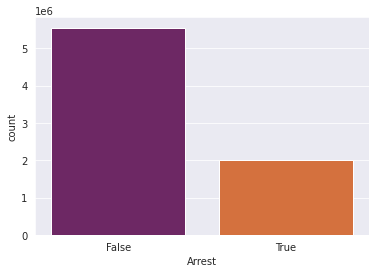

In [113]:
sns.set_style("darkgrid")
sns.countplot(x="Arrest", palette='inferno', data=df);

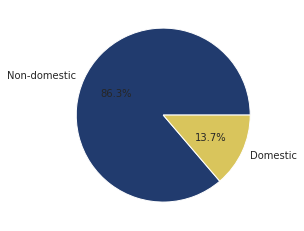

In [114]:
df_by_domestic = df.Domestic.value_counts()

sns.set_style("darkgrid")

#define Seaborn color palette to use
colors = [sns.color_palette('cividis')[0],
          sns.color_palette('cividis')[5]]

#create pie chart
plt.pie(df_by_domestic, labels = ["Domestic", "Non-domestic"][::-1], 
        colors = colors, autopct='%.1f%%')
plt.show()

# sns.countplot(x="Domestic", palette='cividis', data=df);

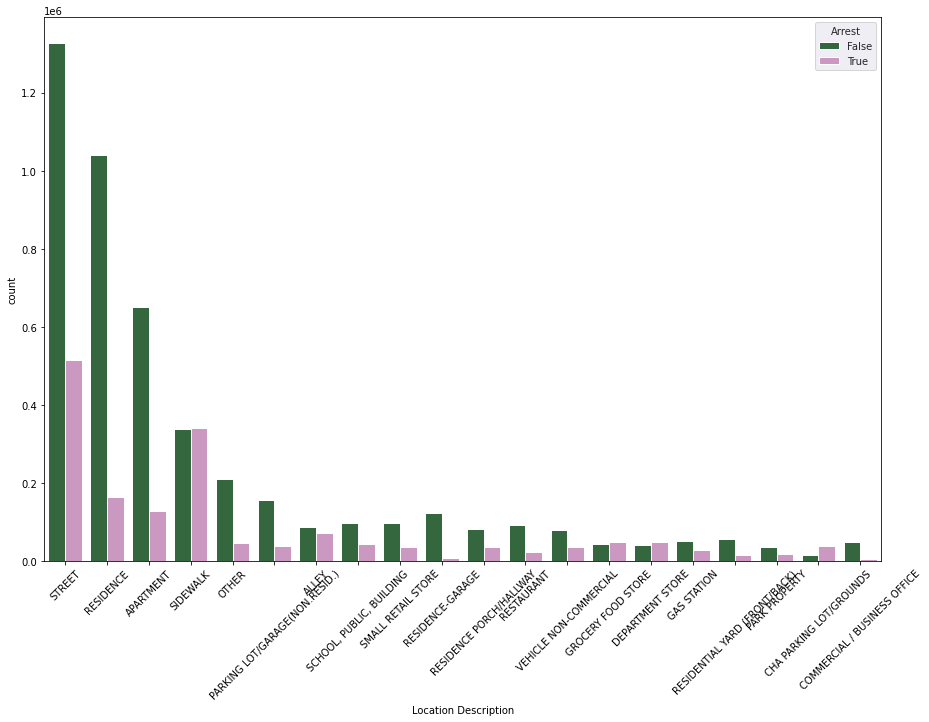

In [ ]:
plt.figure(figsize = (15, 10))
plt.xticks(rotation=45)
sns.set_style('darkgrid')
sns.countplot(x= 'Location Description', 
              hue="Arrest",
              data = df, 
              order = df['Location Description'].value_counts().iloc[:20].index,
              palette='cubehelix');

## Crimes over time

### What year had the most crime?

In [ ]:
df.head(1)

,Date,Block,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,Year,Latitude,Longitude,Month,Day,Hour
0,2015-09-05 13:30:00,0,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,0,True,924,9,12,61,08B,2015,41.815117,-87.67,9,5,13


In [ ]:
## Count number of reported crimes for each year
# crime_counts_by_year_by_arrest = df.groupby(['Year','Arrest']).size()

In [ ]:
# plt.figure(figsize=(18, 5))
# crime_counts_by_year_by_arrest.sort_index(inplace=True)
# # crime_counts_by_year_by_arrest.plot(kind="bar");

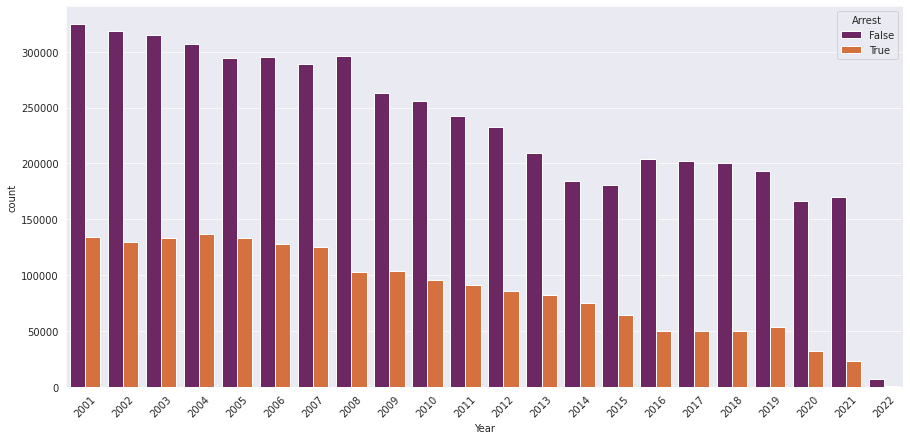

In [ ]:
plt.figure(figsize = (15, 7))
plt.xticks(rotation=45)
sns.set_style('darkgrid')
sns.countplot(x= 'Year', 
              hue="Arrest",
              data = df, 
              order = sorted(df.Year.unique()),
              palette='inferno');

In [115]:
import gc
# del crime_counts_by_year_by_arrest
gc.collect()

4024

### Monthly checkup

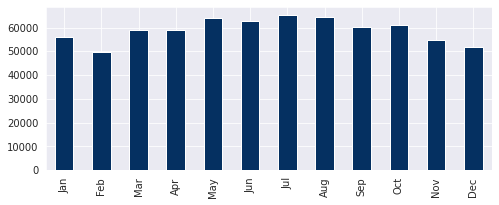

In [118]:
mask = (df.Year == 2001)
FRAC = 0.1

month_mapping = {1:"Jan", 2:"Feb", 3:"Mar",
                 4:"Apr", 5:"May", 6:"Jun",
                 7:"Jul", 8:"Aug", 9:"Sep",
                 10:"Oct", 11:"Nov", 12:"Dec"}

crime_counts_by_month = pd.to_datetime(df[mask].sample(frac=FRAC).Date).dt.month.value_counts()
crime_counts_by_month.sort_index(inplace=True)
crime_counts_by_month.index = [month_mapping[k] for k in crime_counts_by_month.index]
plt.figure(figsize=(8, 3))
crime_counts_by_month.plot.bar(colormap="RdBu_r");

#### Monthly Heatmap over Years

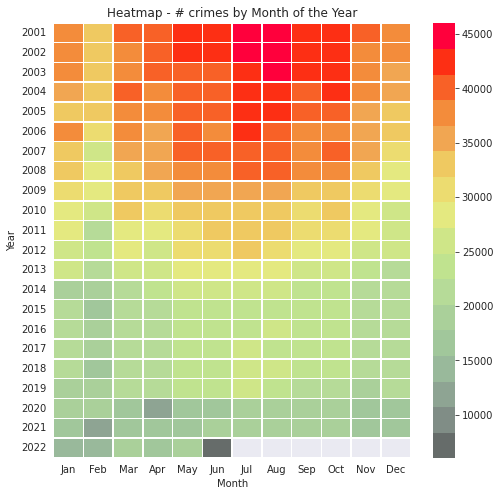

In [132]:
# Starting over
heatmap_data = df[["Month", "Year"]].copy()

# Next we add the year as column and group the 
# data up to annual day of week level
heatmap_data = heatmap_data.groupby(['Month', 
                                     'Year']).size()

# Reset index 
heatmap_data = heatmap_data.reset_index(name='counts')

# # We drop off some years where they're not a full year

# # Pivot it to a uniform data format for heatmaps
heatmap_data = heatmap_data.pivot(index='Year', 
                                  columns='Month', 
                                  values='counts')


# # Reordering columns
heatmap_data.rename(columns=month_mapping, inplace=True)

# # Visualise electricity load via Heatmap
plt.figure(figsize=(8, 8))
sns.heatmap(heatmap_data, linewidths=.5, 
            cmap=gyr, cbar=True, 
            cbar_kws={"format": '%1.0f'}).\
            set_title('Heatmap - # crimes by Month of the Year');

### Checking frequency of crimes over days of the week

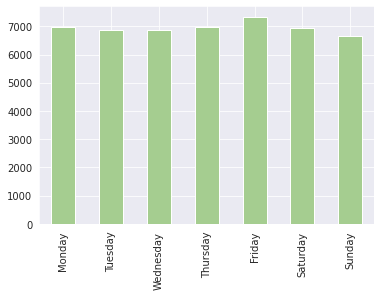

In [133]:
mask = (df.Year == 2001)
FRAC = 0.1

dow_mapping = {
    'Monday': 0,
    'Tuesday': 1,
    'Wednesday': 2,
    'Thursday': 3,
    'Friday': 4,
    'Saturday': 5,
    'Sunday': 6
}
dow_mapping = {value: key for key, value in dow_mapping.items()}

crime_counts_by_day = pd.to_datetime(df[mask].sample(frac=FRAC).Date).dt.dayofweek.value_counts()
crime_counts_by_day.sort_index(inplace=True)
crime_counts_by_day.index = [dow_mapping[key] 
                             for key in crime_counts_by_day.index]
crime_counts_by_day.plot.bar(colormap="crest");

#### Daily Heatmap over Years 
##### (and probably months)

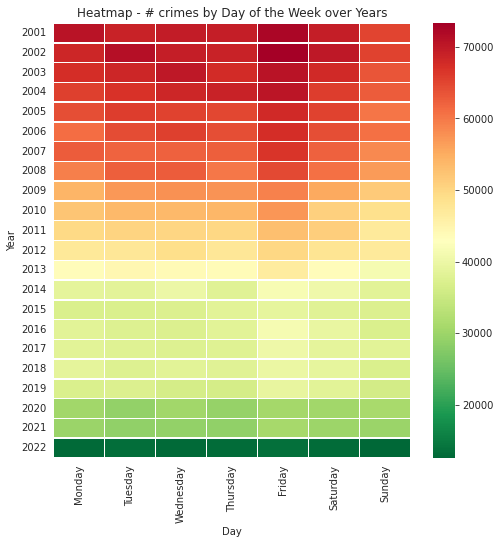

In [140]:
# Starting over
del heatmap_data
heatmap_data = df[["Date", "Year"]].copy()
heatmap_data.Date = df.Date.dt.dayofweek
heatmap_data.rename(columns={"Date":"Day"}, inplace=True)

# Next we add the year as column and group the 
# data up to annual day of week level
heatmap_data = heatmap_data.groupby(['Day', 
                                     'Year']).size()

# Reset index 
heatmap_data = heatmap_data.reset_index(name='counts')

# # We drop off some years where they're not a full year

# # Pivot it to a uniform data format for heatmaps
heatmap_data = heatmap_data.pivot(index='Year', 
                                  columns='Day', 
                                  values='counts')


# # Reordering columns
heatmap_data.rename(columns=dow_mapping, inplace=True)

# # Visualise electricity load via Heatmap
plt.figure(figsize=(8, 8))
sns.heatmap(heatmap_data, linewidths=.5, 
            cmap='RdYlGn_r', cbar=True, 
            cbar_kws={"format": '%1.0f'}).\
            set_title('Heatmap - # crimes by Day of the Week over Years');

Why does the above plot isn't as useful as the former one?

- [ ] Going 3D plots for this, yet?

## Time Series Visualization

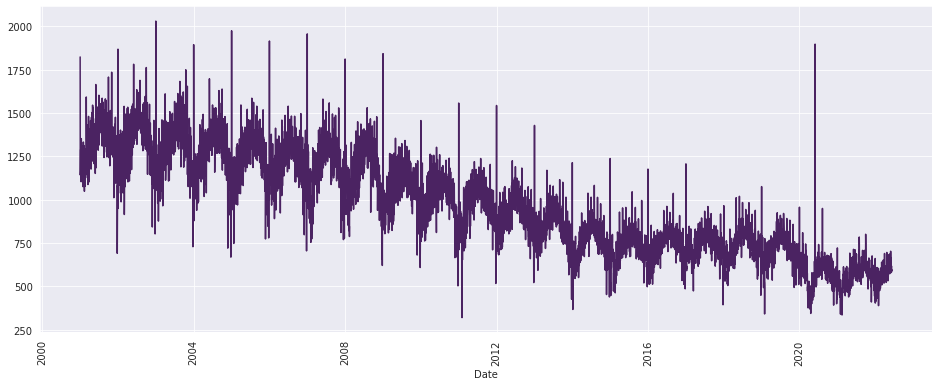

In [137]:
plt.figure(figsize=(16, 6))

df.Date.groupby(df.Date.dt.date).size().plot(rot=90, colormap="flare_r");

We can see that there's downward trend into the present date, however there's an unsual spike, right after 2020! It turns out this spike is somehow related to the series of protests and civil unrest against police brutality and racism caused by <font color="cyan">the murder of George Floyd in May 26th 2020. </font>

Now let's plot a few important crimes over time and see which kinds of crime were most responsible for that spike around May 2020:

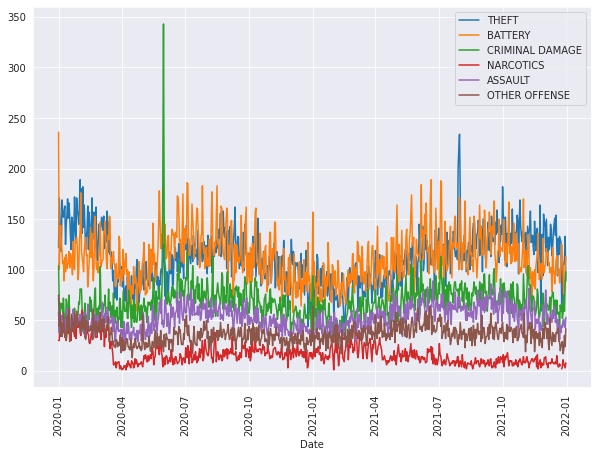

In [141]:
df_2019 = df[(df.Date.dt.year > 2019)&(df.Date.dt.year < 2022)]

selected_types = [
                 "THEFT", "BATTERY", "CRIMINAL DAMAGE",
                 "NARCOTICS", "ASSAULT", "OTHER OFFENSE"
]

selected_df = pd.DataFrame(index=df_2019.Date.dt.date)

for primary_type in selected_types:
  selected_df[primary_type] = df_2019[df_2019["Primary Type"] == primary_type].groupby(df_2019.Date.dt.date).size()

selected_df.plot(rot=90, figsize=(10, 7));

This plot confirms our observation, we see that despite being less often than `THEFT` and `BATTERY`, around May of 2020, `CRIMINAL DAMAGE` spiked a lot higher than the two.

### What about arrests and violent crimes over time?

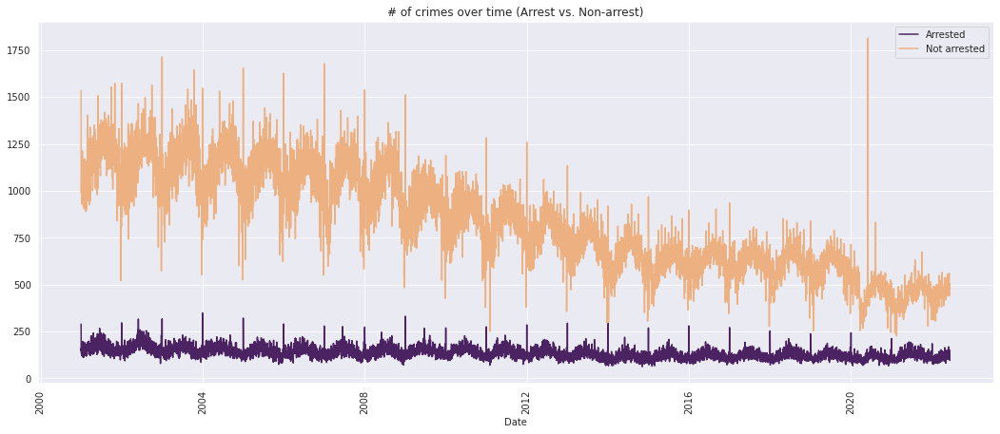

In [142]:
df_arrest = pd.DataFrame(index=df.Date.dt.date)

df_arrest["Arrested"] = df[df.Domestic].groupby(df.Date.dt.date).size()
df_arrest["Not arrested"] = df[~df.Domestic].groupby(df.Date.dt.date).size()

# checking violence over time
df_arrest.plot(rot=90, figsize=(18, 7),
               colormap="flare_r",
               title="# of crimes over time (Arrest vs. Non-arrest)");

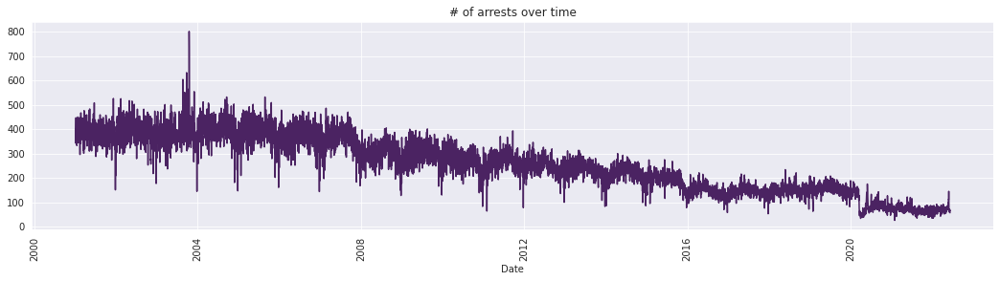

In [143]:
# checking arrests over time
df_arrest = df[df.Arrest == True]
df_arrest.groupby(df_arrest.Date.dt.date).size().plot(rot=90, figsize=(18, 4), 
                                                      title="# of arrests over time",
                                                      colormap="flare_r");

Again, we can see an abnormality before 2004 where the number of arrests get a giant spike. We might as well further investigate to justify this kind of behaviour.

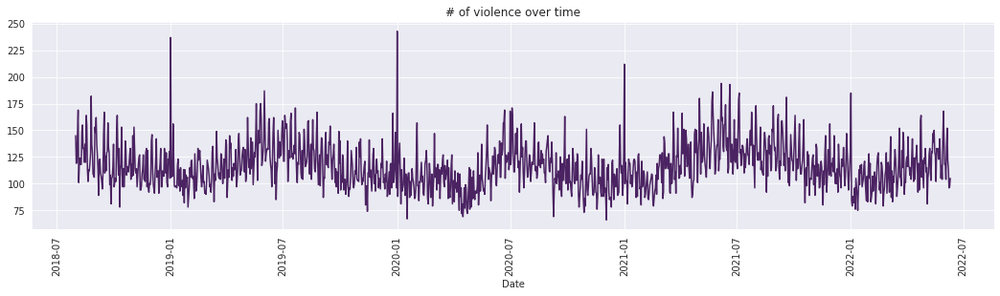

In [144]:
# starting from August 1st 2018
df_domestic = df[(df.Domestic == True)&(df.Date.dt.date >= datetime.date(2018, 8, 1))]
df_domestic.groupby(df_domestic.Date.dt.date).size().plot(rot=90, figsize=(18, 4), 
                                                      title="# of violence over time",
                                                      colormap="flare_r");

### Checking our target change over time

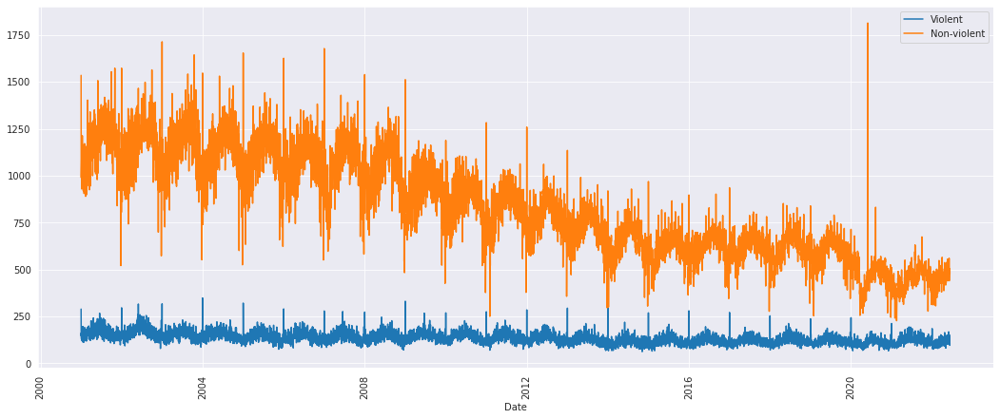

In [145]:
df_domestic = pd.DataFrame(index=df.Date.dt.date)

df_domestic["Violent"] = df[df.Domestic].groupby(df.Date.dt.date).size()
df_domestic["Non-violent"] = df[~df.Domestic].groupby(df.Date.dt.date).size()

# checking violence over time
df_domestic.plot(rot=90, figsize=(18, 7));

In [146]:
df.columns

Index(['Date', 'Block', 'IUCR', 'Primary Type', 'Description',
       'Location Description', 'Arrest', 'Domestic', 'Beat', 'District',
       'Ward', 'Community Area', 'FBI Code', 'Year', 'Latitude', 'Longitude',
       'Month', 'Day', 'Hour'],
      dtype='object')

## Pearson's r (the Standard Correlation Coefficients)

In [153]:
gc.collect()

23816

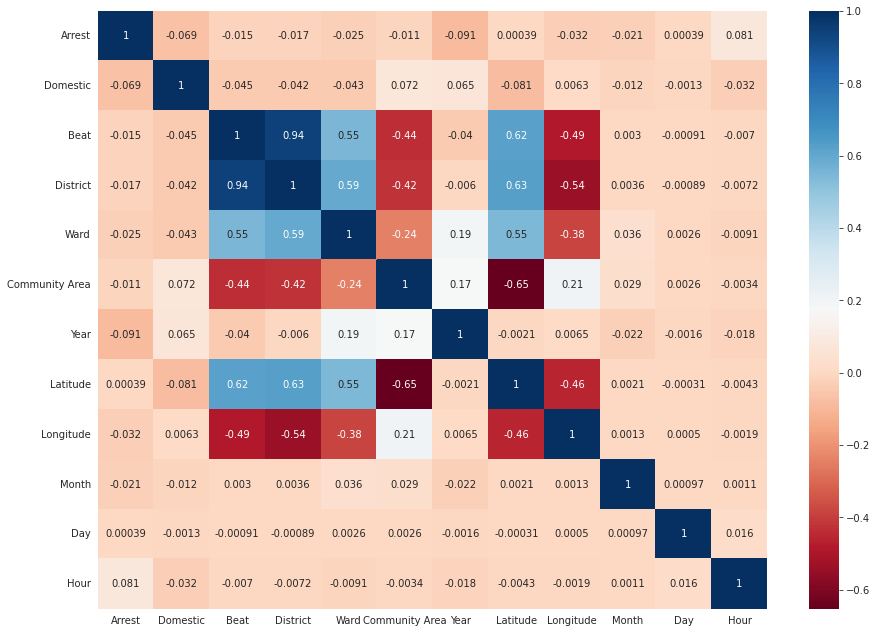

In [156]:
plt.figure(figsize=(15,11))
sns.heatmap(df.corr(),annot=True, cmap='RdBu');

# Data Preparation

At this stage we might have a basic idea of how our modeling is going to be, so we'll prepare our data with than goal in mind. The problem is to predict whether a set of features will result a violent(`Domestic`) or nonviolent crime (that's basic information alright, the target is known as opposed to potential predictors). The first important thing we should do is put a test size aside and never see it again, to have a sound judgement of our performance:

In [157]:
df.shape

(7561890, 19)

In [159]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(df, test_size=0.05, random_state=42)
# if the dataset gets updated, then there's no guarantee that this
# can replicate the results

<a id="bitch"></id>

## Start Here?

It's always considered "best practice" to set aside a test set, and never see it again (and in even more extreme cases, at the phase of Data Understanding) unless you've come up with your best model, ready for production. This can avoid over-fitting to dev set!

In [163]:
train.to_csv("chicago-train.csv", index=False)
test.to_csv("chicago-test.csv", index=False)
# !mv chicago-test.csv /content/gdrive/MyDrive/
# !mv chicago-train.csv /content/gdrive/MyDrive/
TRAIN_PATH = "chicago-train.csv"
TEST_PATH = "Chicago-test.csv"

In [164]:
dtypes = {
    "Beat": "int16",
    "Community Area": "int8",
    "District": "int8",
    "Ward": "int8",
    "Month": "int8",
    "Day": "int8",
    "Hour": "int8",
    "Year": "int16"
}

In [166]:
del df
gc.collect()

24001

In [165]:
del df
t0 = time.time()
train = pd.read_csv(TRAIN_PATH, dtype=dtypes)
print("Time elapsed:", time.strftime("%H:%M:%S",
                                     time.gmtime(time.time() - t0)))

Time elapsed: 00:00:44


In [167]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7183795 entries, 0 to 7183794
Data columns (total 19 columns):
 #   Column                Dtype  
---  ------                -----  
 0   Date                  object 
 1   Block                 object 
 2   IUCR                  object 
 3   Primary Type          object 
 4   Description           object 
 5   Location Description  object 
 6   Arrest                bool   
 7   Domestic              bool   
 8   Beat                  int16  
 9   District              int8   
 10  Ward                  int8   
 11  Community Area        int8   
 12  FBI Code              object 
 13  Year                  int16  
 14  Latitude              float64
 15  Longitude             float64
 16  Month                 int8   
 17  Day                   int8   
 18  Hour                  int8   
dtypes: bool(2), float64(2), int16(2), int8(6), object(7)
memory usage: 575.5+ MB


## Handling Missing Values

In [168]:
(train.isnull().sum() / train.shape[0]) * 100

Date                    0.000000
Block                   0.000000
IUCR                    0.000000
Primary Type            0.000000
Description             0.000000
Location Description    0.000000
Arrest                  0.000000
Domestic                0.000000
Beat                    0.000000
District                0.000000
Ward                    0.000000
Community Area          0.000000
FBI Code                0.000000
Year                    0.000000
Latitude                1.056378
Longitude               1.056378
Month                   0.000000
Day                     0.000000
Hour                    0.000000
dtype: float64

As a rule of thumb, I recall:
- less than 5% missing, drop the records
- more than 5% and less than 25% missing, impute
- more than 25%, drop the column (negotiable) 

In [169]:
train.dropna(subset=['Latitude', 'Longitude',], inplace=True)

## Miscellaneous Univariate Analyses

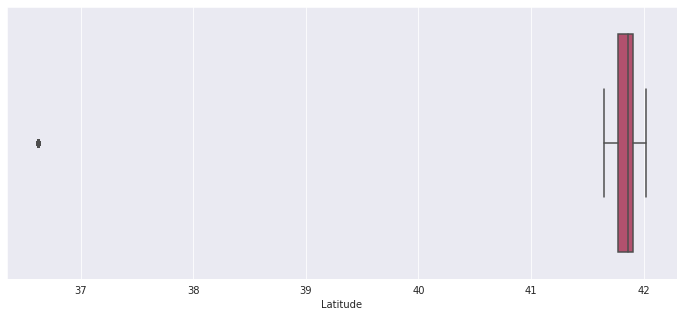

In [170]:
plt.figure(figsize=(12,5))
sns.boxplot(x='Latitude', data=train, palette="flare_r");

In [171]:
(train[train.Latitude < 41.63]).shape[0]

109

In [172]:
train[train.Longitude < -88].shape[0]

109

Certainly these strange points represent some kind of outliers, we'll gonna get rid of these:

In [173]:
train.drop(train[train['Longitude'] < -88].index, inplace = True)

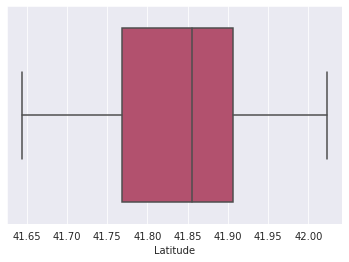

In [174]:
sns.boxplot(x='Latitude', data=train, palette="flare_r");

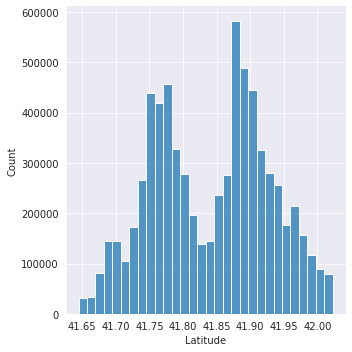

In [175]:
sns.displot(x="Latitude", data=train, bins=30, palette="flare_r");

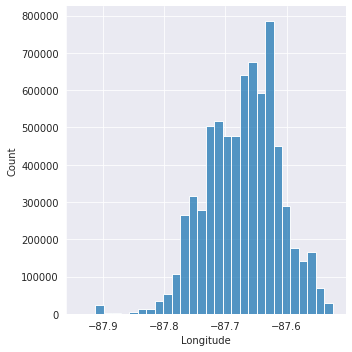

In [176]:
sns.displot(x="Longitude", data=train, bins=30, palette="flare_r");

## Handling Categorical Variables

_**this step should be carefully adjusted, or it can be skipped using CatboostClassifier**_

Let's easily factorize the `FBI Code` which there's nothing serious about it: (by "nothing serious" I mean the codes are number with occasionally some alphabets (A, B) appended to them)

In [177]:
train["Block"].nunique()

60183

In [178]:
train["FBI Code"].value_counts()

06     1493808
08B    1118386
14      814647
26      704342
18      654154
05      395467
08A     354130
07      329943
03      268569
11      254507
04B     196024
04A     123390
15       94247
16       65552
24       52479
10       38588
17       33819
02       33237
20       27758
19       14065
22       13836
09       12046
01A      10745
13        2748
12        1249
01B         62
Name: FBI Code, dtype: int64

In [179]:
train['Block'] = pd.factorize(train["Block"])[0] # This one is taken from Kh. Shiri, not sure if it works
train["FBI Code"] = pd.factorize(train["FBI Code"])[0]

Separating numerical and categorical columns:

In [180]:
train["Block"].value_counts()

2263     15075
38       13843
1151      9414
1875      8783
494       8244
         ...  
54636        1
54631        1
54629        1
54621        1
60182        1
Name: Block, Length: 60183, dtype: int64

In [181]:
numerical_cols = train.select_dtypes(exclude=['object']).columns
categorical_cols = train.select_dtypes(include=['object']).columns

In [182]:
print(*categorical_cols, sep=", ")

Date, IUCR, Primary Type, Description, Location Description


In [183]:
print(*numerical_cols, sep=", ")

Block, Arrest, Domestic, Beat, District, Ward, Community Area, FBI Code, Year, Latitude, Longitude, Month, Day, Hour


In [184]:
train["Primary Type"].nunique()

36

In [185]:
train["Description"].nunique()

537

In [186]:
train["Location Description"].nunique()

214

## Feature Engineering

### Feature Extraction

The idea feature extracting using *haversine distance* is taken from [here](https://towardsdatascience.com/the-hitchhikers-guide-to-feature-extraction-b4c157e96631). This will take some time. (~6m)

In [187]:
t0 = time.time()
lat_mean=train.Latitude.mean()
long_mean=train.Longitude.mean()

def haversine_np(lon1, lat1):
    lon1, lat1, lon2, lat2 = list(map(np.radians, [lon1, lat1, 
                                              long_mean, lat_mean]))

    distance_lon = lon2 - lon1
    distance_lat = lat2 - lat1

    a = np.sin(distance_lat/2.0)**2 + np.cos(lat1) * np.cos(lat2) *\
     np.sin(distance_lon/2.0)**2

    c = 2 * np.arcsin(np.sqrt(a))
    km = 6367 * c
    return km

train['Distance']=train.apply(lambda x: haversine_np(x.Longitude, 
                                                     x.Latitude),
                              axis=1)


print("Time elapsed:", time.strftime("%H:%M:%S",
                                     time.gmtime(time.time() - t0)))

TypeError: ignored

In [ ]:
t0 = time.time()
lat_mean=np.radians(train.Latitude.mean())
long_mean=np.radians(train.Longitude.mean())

a = np.sin((np.radians(train.Latitude) - 
            lat_mean)/2.) ** 2 + np.cos(np.radians(train.Latitude)) * \
np.sin((np.radians(train.Longitude) - long_mean)/2.) ** 2

train["Distance1"]=  6367 * 2 * np.arcsin(np.sqrt(a))

print("Time elapsed:", time.strftime("%H:%M:%S",
                                     time.gmtime(time.time() - t0)))

In [ ]:
train[["Distance", "Distance1"]] ## This shit needs some Error Analysis

,Distance,Distance1
0,4.251695,4.504497
1,14.989813,15.247546
2,1.035135,1.102931
3,10.077069,10.236432
4,6.181446,6.509572
...,...,...
7101441,13.447949,14.138522
7101442,5.967002,6.003228
7101443,12.425723,12.882950
7101444,6.755457,7.249306


<h4> Looking for Pearson's r w.r.t. our Target (and maybe Loop back to Feature Engineering) </h4>

## Handling Imbalanced-ness of the target value

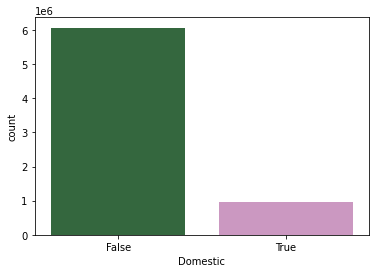

In [ ]:
sns.countplot(data=train, x="Domestic", palette='cubehelix');

In [ ]:
train.shape[0]

7029158

To handle this problem, we would like to use a mixed combination of <strike>oversampling</strike> and undersampling as follows:

In [ ]:
# first we separate the dataset into two different categories
train_1 = train[train.Domestic]
train_0 = train[~train.Domestic]

In [ ]:
# we check their corresponding sizes
train_0.shape[0], train_1.shape[0]

(6065265, 963893)

In [ ]:
# now we sample a frac0 multiplication of train_0
# and frac1 proportion of the train_1
frac0 = 0.1495
frac1 = 0.9408

# we see that the difference is almost minimal
963893 * frac1  - 6065265 * frac0

73.41690000006929

We also build n folds of these samples, shuffle them up together and create n folds of dataset for further training:

In [ ]:
%%time
from sklearn.utils import shuffle

n = 4
dfs = {}
for i in range(n):
    dfs[f"df_{i}"] = pd.concat([train_0.sample(frac=frac0), 
                                train_1.sample(frac=frac1)])
    dfs[f"df_{i}"] = shuffle(dfs[f"df_{i}"]).reset_index(drop=True)

CPU times: user 31 s, sys: 1.25 s, total: 32.2 s
Wall time: 32.1 s


In [ ]:
dfs.keys()

dict_keys(['df_1', 'df_2', 'df_3', 'df_4'])

In [ ]:
dfs["df_3"].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1813588 entries, 0 to 1813587
Data columns (total 20 columns):
 #   Column                Dtype  
---  ------                -----  
 0   Date                  object 
 1   Block                 object 
 2   IUCR                  object 
 3   Primary Type          object 
 4   Description           object 
 5   Location Description  object 
 6   Arrest                bool   
 7   Domestic              bool   
 8   Beat                  int64  
 9   District              int64  
 10  Ward                  int64  
 11  Community Area        int64  
 12  FBI Code              object 
 13  Year                  int64  
 14  Latitude              float64
 15  Longitude             float64
 16  Month                 int64  
 17  Day                   int64  
 18  Hour                  int64  
 19  Distance              float64
dtypes: bool(2), float64(3), int64(8), object(7)
memory usage: 252.5+ MB


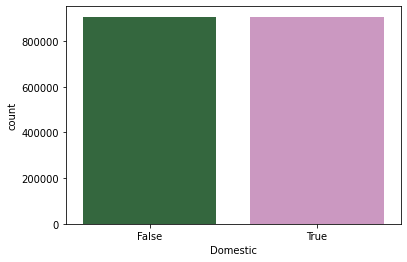

In [ ]:
# We can check that each fold is indeed balanced
i = 2

sns.countplot(x="Domestic", data=dfs[f"df_{i}"],palette='cubehelix');

Saving the folds:

In [ ]:
t0=time.time()

for n, key in enumerate(dfs.keys()):
  dfs[key].to_csv(f"df_train_fold_{n+1}.csv", index=False)

print("Time elapsed:", time.strftime("%H:%M:%S",
                                     time.gmtime(time.time() - t0)))

Time elapsed: 00:01:38


In [ ]:
# !mkdir gdrive/MyDrive/chicago_folds
# !mv df_train_* gdrive/MyDrive/chicago_folds

# Modeling and Learning

In [ ]:
import os, sys, math, io # some basic built-in packages
import pickle # a package for saving models and parameters
import time, datetime # working with time and datetime
import numpy as np # linear algebra manipulation
import statsmodels.api as sm # statistical testing
import pandas as pd # preprocessing and dataframe manipulation
import random # working with random
!pip install chart_studio # using plotly service
import plotly.graph_objects as go # plotly
import plotly.express as px # another light-weighted version of plotly
import gc  # for force-garbage collecting
!pip install geopandas # to work with geo-spatial datasets
import geopandas as gpd # see above
import folium as fo # working with geospatial visualization
import matplotlib.pyplot as plt # data visualization
import seaborn as sns # data visualization
import matplotlib.cm as cm # colormap for prettier visualization
from scipy.ndimage.filters import gaussian_filter
import matplotlib.image as mpimg # working with image right into data visualization
import matplotlib as mpl # data visualization
!pip install sodapy # using Socrata API for updating dataset
from sodapy import Socrata
# !pip install selenium # 
# from selenium import webdriver # 
from google.cloud import bigquery  # if you happen to not have the dataset locally
from pandas.plotting import scatter_matrix # for creating pearson's r correlation heatmap
from sklearn.model_selection import train_test_split # creating train and test sets
from tqdm import tqdm # having a progress bar in the notebook
from IPython.core.display import display, HTML # for creating html components such as tables

## DEPENDING ON WHAT MACHINE YOU'RE ON AND WHAT ACCOUNT YOU HAVE 
MyAppToken = "2RGEmjxUPEpkabovNKIPMeQTF" # For Socrata API
USER = "couzhei@gmail.com" # For Socrata API
PASS = "BiQKvbKj@fU6njR" # For Socrata API
TRAIN_PATH = "gdrive/MyDrive/chicago_crime.csv"
IMAGES_PATH = "gdrive/MyDrive/images"
GEO_PATH = '/content/gdrive/MyDrive/miscdata/'
MODELS_AND_PARAMS_PATH = "gdrive/MyDrive/savedModelsnParams/chicago" # For models progress
FOLDS_PATH = "gdrive/MyDrive/chicago_folds"


## PLEASE COMMENT THE FOLLOWING IF YOU WISH NOT TO HAVE YOUR GOOGLE DRIVE AS
## CHECKPOINTS!
from google.colab import drive # connecting to and mounting google drive
drive.mount('/content/gdrive')

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


     |████████████████████████████████| 64 kB 2.7 MB/s 
  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11447 sha256=8d1034b9a4e07adfa2e3176c4c1c161c1bd111474bb203da90296bcb6c1c6f9f
  Stored in directory: /root/.cache/pip/wheels/f9/8d/8d/f6af3f7f9eea3553bc2fe6d53e4b287dad18b06a861ac56ddf
Successfully built retrying
     |████████████████████████████████| 1.0 MB 23.1 MB/s 
     |████████████████████████████████| 16.7 MB 201 kB/s 
     |████████████████████████████████| 6.3 MB 38.8 MB/s 
Mounted at /content/gdrive


In [ ]:
MODELS_AND_PARAMS_PATH = "gdrive/MyDrive/savedModelsnParams/chicago"

# creating this as file to save performances
# this is particularly useful if you haven't 
# got sufficient RAM, so each time you reset this
# notebook, you know where you got your 
# # performances for the first time
# models_performance = {"order": ('rec', 'f1', 'auc', 'time'),}

performance_path = os.path.join(MODELS_AND_PARAMS_PATH, 
                                "models_performance.pickle")
# with open(performance_path, 'wb') as handle:
#     pickle.dump(models_performance, 
#                 handle, protocol=pickle.HIGHEST_PROTOCOL)

with open(performance_path, 'rb') as handle:
    models_performance = pickle.load(handle)

print(models_performance)

{'order': ('rec', 'f1', 'auc', 'time'), 'Logistic Regression': (0.658541270481569, 0.7047010216037327, 0.6874307035973779, '00:00:23'), 'Stochastic Gradient Classifier': (0.6483500267463523, 0.7065409664710138, 0.685227471760211, '00:00:05'), 'eXtreme Gradient Boosting': (0.7894474267126979, 0.827459264991947, 0.8214288330290053, '00:13:06'), 'Light Gradient Boosting': (0.7956220328546173, 0.8370741901776383, 0.8320773227961512, '00:01:08'), 'XGB with GPU 5-fold Validation': (0.8780646682001377, 0.8313435994404303, 0.821926931984901, '00:02:50'), 'Catboost with GPU': (0.8534777651083238, 0.8182477531928313, 0.8090598515842444, '00:00:11')}


In [ ]:
## IMPORTING MACHINE LEARNING PACKAGES AND RELATED TOOLS

import xgboost as xgb # xgboost library
!pip install catboost
import catboost as cat # catboost library
!pip install optuna
import optuna # for hyperparameter tuning
from optuna.samplers import TPESampler
import pickle, joblib # for saving models and other objects
from sklearn.utils import resample # resampling for catboost model
from catboost import Pool # to make use of GPU training
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler, MinMaxScaler # data transformation
from sklearn.preprocessing import LabelEncoder, OneHotEncoder # handling categorical variables
from sklearn.metrics import f1_score, confusion_matrix # some general metrics
from sklearn.metrics import roc_auc_score, accuracy_score # other metrics
from sklearn.metrics import recall_score, precision_score # more specific metrics
from sklearn.model_selection import train_test_split # splitting train and test
from sklearn.model_selection import StratifiedKFold # k-fold Cross-Validation
from sklearn.linear_model import LogisticRegression # baseline model
from sklearn.linear_model import SGDClassifier
import multiprocessing
# !pip install lightgbm
from lightgbm import LGBMClassifier # an excellent estimator from lightgbm package

     |████████████████████████████████| 76.1 MB 44 kB/s 
     |████████████████████████████████| 308 kB 19.2 MB/s 
     |████████████████████████████████| 210 kB 41.0 MB/s 
     |████████████████████████████████| 81 kB 5.1 MB/s 
     |████████████████████████████████| 75 kB 4.0 MB/s 
     |████████████████████████████████| 113 kB 41.7 MB/s 
     |████████████████████████████████| 150 kB 41.9 MB/s 
     |████████████████████████████████| 49 kB 1.8 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=a50611a83b6ffc551f269ac81c107cb261cedd3f49cb91ab03aa6c7ff21b4e71
  Stored in directory: /root/.cache/pip/wheels/9f/18/84/8f69f8b08169c7bae2dde6bd7daf0c19fca8c8e500ee620a28
Successfully built pyperclip


### Feeding our model with the data first (for a 4-fold validation)

## Time-Series Forecasting (to be done)

## Text Mining

In [ ]:
!ls gdrive/MyDrive/chicago_folds

df_train_fold_1.csv  df_train_fold_3.csv
df_train_fold_2.csv  df_train_fold_4.csv


## Finalizing Preprocessing

In [ ]:
t0 = time.time()
dfs = {}
for i in range(4):
  dfs[f"df_{i + 1}"] = pd.read_csv(os.path.join(FOLDS_PATH, 
                                                f"df_train_fold_{i + 1}.csv"))
print("Time elapsed:", time.strftime("%H:%M:%S",
                                     time.gmtime(time.time() - t0)))

Time elapsed: 00:00:31


In [ ]:
X = dfs["df_2"].loc[:, ~dfs["df_2"].columns.isin(['Domestic'])]
y = dfs["df_2"].Domestic

In [ ]:
X.shape[0]

1813588

In [ ]:
X["Primary Type"].nunique()

36

In [ ]:
N = 30
koala = X["Primary Type"].value_counts()[:N].index

In [ ]:
X.loc[~X["Primary Type"].isin(koala), "Primary Type"] = "OTHERS"

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [ ]:
X["Primary Type"].value_counts()

BATTERY                              640354
THEFT                                251228
CRIMINAL DAMAGE                      173984
OTHER OFFENSE                        168886
ASSAULT                              149135
NARCOTICS                            103524
BURGLARY                              61549
MOTOR VEHICLE THEFT                   50194
DECEPTIVE PRACTICE                    46200
ROBBERY                               43597
CRIMINAL TRESPASS                     35171
OFFENSE INVOLVING CHILDREN            26962
WEAPONS VIOLATION                     13778
PROSTITUTION                           9764
PUBLIC PEACE VIOLATION                 9133
CRIM SEXUAL ASSAULT                    6286
SEX OFFENSE                            5949
INTERFERENCE WITH PUBLIC OFFICER       2542
KIDNAPPING                             2441
ARSON                                  2266
HOMICIDE                               2117
GAMBLING                               2085
LIQUOR LAW VIOLATION            

In [ ]:
# I exclude Description and Location Description for further Text Analytics
# this could take a full course of action or actions, yet to be discovered
# Also it could be done using simple methods while using GPU
selected_cols = ['Block', 'Primary Type', 'Arrest', 'Beat', 
                 'District', 'Ward', 'Community Area', 'Latitude', 
                 'Longitude', 'Month', 'Day', 'Hour', 'Year',
                 'Distance']
# Also it might be interesting to just feed variables like
# Location Description right into Catboost to check its 
# capability

In [ ]:
X = X[selected_cols]

In [ ]:
X.head(3)

,Block,Primary Type,Arrest,Beat,District,Ward,Community Area,Latitude,Longitude,Month,Day,Hour,Year,Distance
0,053XX S MILLARD AVE,ASSAULT,False,822,8,23,62,41.796343,-87.714667,4,8,19,2018,6.559852
1,077XX S KINGSTON AV,BATTERY,False,421,4,0,0,41.754787,-87.562656,3,17,8,2002,14.265051
2,061XX S WABASH AVE,BATTERY,False,311,3,20,40,41.782881,-87.623774,10,24,19,2013,8.024955


In [ ]:
X[:5]

,Block,Primary Type,Arrest,Beat,District,Ward,Community Area,Latitude,Longitude,Month,Day,Hour,Year,Distance
0,053XX S MILLARD AVE,ASSAULT,False,822,8,23,62,41.796343,-87.714667,4,8,19,2018,6.559852
1,077XX S KINGSTON AV,BATTERY,False,421,4,0,0,41.754787,-87.562656,3,17,8,2002,14.265051
2,061XX S WABASH AVE,BATTERY,False,311,3,20,40,41.782881,-87.623774,10,24,19,2013,8.024955
3,076XX S CHAPPEL AVE,BURGLARY,False,414,4,8,43,41.756248,-87.574865,8,7,7,2008,13.313184
4,080XX S ELLIS AVE,ASSAULT,False,631,6,8,44,41.748924,-87.600266,11,18,11,2004,12.415523


## Using Logistic Regression

In [ ]:
# splitting the train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05)

# label encoding the categorical variables
le = LabelEncoder()
X_train["Primary Type"] = le.fit_transform(X_train["Primary Type"])

mm = MinMaxScaler()
ss = StandardScaler()
cols_to_mm = ["Primary Type", "Beat", "District", "Ward", 
                 "Community Area", "Block", 
                 "Month", "Day", 
                 "Hour", "Year", "Distance"]

cols_to_ss = ["Latitude", "Longitude"]

X_train[cols_to_mm] = mm.fit_transform(X_train[cols_to_mm])
X_train[cols_to_ss] = ss.fit_transform(X_train[cols_to_ss])

t0 = time.time()
lr = LogisticRegression()

lr.fit(X_train, y_train)
time_to_train = time.strftime("%H:%M:%S",time.gmtime(time.time() - t0))
print("Time elapsed:", time_to_train)

ValueError: ignored

In [ ]:
X_test["Primary Type"] = le.transform(X_test["Primary Type"])
X_test[cols_to_ss] = ss.transform(X_test[cols_to_ss])
X_test[cols_to_mm] = mm.transform(X_test[cols_to_mm])
y_pred = lr.predict(X_test)
lr_acc = accuracy_score(y_pred, y_test)
lr_f1 = f1_score(y_pred, y_test)
lr_auc = roc_auc_score(y_pred, y_test)
lr_rec = recall_score(y_pred, y_test)
print("Recall:", lr_rec)
print("Accuracy:", lr_acc)
print("F1-score:", lr_f1)
print("AUC ROC:", lr_auc)
print("Confusion Matrix:\n", confusion_matrix(y_pred, y_test))

Recall: 0.658541270481569
Accuracy: 0.6831495368328186
F1-score: 0.7047010216037327
AUC ROC: 0.6874307035973779
Confusion Matrix:
 [[27665 10956]
 [17776 34283]]


In [ ]:
type(lr).__name__

'LogisticRegression'

In [ ]:
le.classes_

array(['ARSON', 'ASSAULT', 'BATTERY', 'BURGLARY',
       'CONCEALED CARRY LICENSE VIOLATION', 'CRIM SEXUAL ASSAULT',
       'CRIMINAL DAMAGE', 'CRIMINAL SEXUAL ASSAULT', 'CRIMINAL TRESPASS',
       'DECEPTIVE PRACTICE', 'GAMBLING', 'HOMICIDE',
       'INTERFERENCE WITH PUBLIC OFFICER', 'INTIMIDATION', 'KIDNAPPING',
       'LIQUOR LAW VIOLATION', 'MOTOR VEHICLE THEFT', 'NARCOTICS',
       'OBSCENITY', 'OFFENSE INVOLVING CHILDREN',
       'OTHER NARCOTIC VIOLATION', 'OTHER OFFENSE', 'OTHERS',
       'PROSTITUTION', 'PUBLIC INDECENCY', 'PUBLIC PEACE VIOLATION',
       'ROBBERY', 'SEX OFFENSE', 'STALKING', 'THEFT', 'WEAPONS VIOLATION'],
      dtype=object)

In [ ]:
performance_path = os.path.join(MODELS_AND_PARAMS_PATH, 
                                "models_performance.pickle")

models_performance = {}

with open(performance_path, 'rb') as handle:
    models_performance = pickle.load(handle)

models_performance["Logistic Regression"] = (lr_rec, lr_f1, 
                                             lr_auc, time_to_train)

with open(performance_path, 'wb') as handle:
    pickle.dump(models_performance, 
                handle, protocol=pickle.HIGHEST_PROTOCOL)

## Stochastic Gradient Classifier

In [ ]:
# splitting the train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05)

# label encoding the categorical variables
le = LabelEncoder()
X_train["Primary Type"] = le.fit_transform(X_train["Primary Type"])

mm = MinMaxScaler()
ss = StandardScaler()
cols_to_mm = ["Primary Type", "Beat", "District", "Ward", 
                 "Community Area", "Block", 
                 "Month", "Day", 
                 "Hour", "Year", "Distance"]

cols_to_ss = ["Latitude", "Longitude"]

X_train[cols_to_mm] = mm.fit_transform(X_train[cols_to_mm])
X_train[cols_to_ss] = ss.fit_transform(X_train[cols_to_ss])

t0 = time.time()
sgd = SGDClassifier()

sgd.fit(X_train, y_train)
time_to_train = time.strftime("%H:%M:%S",time.gmtime(time.time() - t0))
print("Time elapsed:", time_to_train)

Time elapsed: 00:00:05


In [ ]:
X_test["Primary Type"] = le.transform(X_test["Primary Type"])
X_test[cols_to_ss] = ss.transform(X_test[cols_to_ss])
X_test[cols_to_mm] = mm.transform(X_test[cols_to_mm])
y_pred = sgd.predict(X_test)
sgd_acc = accuracy_score(y_pred, y_test)
sgd_f1 = f1_score(y_pred, y_test)
sgd_auc = roc_auc_score(y_pred, y_test)
sgd_rec = recall_score(y_pred, y_test)
print("Recall:", sgd_rec)
print("Accuracy:", sgd_acc)
print("F1-score:", sgd_f1)
print("AUC ROC:", sgd_auc)
print("Confusion Matrix:\n", confusion_matrix(y_pred, y_test))

Recall: 0.6483500267463523
Accuracy: 0.6780105866784296
F1-score: 0.7065409664710138
AUC ROC: 0.685227471760211
Confusion Matrix:
 [[26333 10134]
 [19064 35149]]


In [ ]:
models_performance = {}

with open(performance_path, 'rb') as handle:
    models_performance = pickle.load(handle)

models_performance["Stochastic Gradient Classifier"] = (sgd_rec, sgd_f1, 
                                             sgd_auc, time_to_train)

with open(performance_path, 'wb') as handle:
    pickle.dump(models_performance, 
                handle, protocol=pickle.HIGHEST_PROTOCOL)

## Using Naive Bayes Classifier

## Using Neural Nets

## Using XGBoost on CPU

Taking one fold of our train dataset:

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05)

In [ ]:
le = LabelEncoder()
X_train["Primary Type"] = le.fit_transform(X_train["Primary Type"])

In [ ]:
t0 = time.time()
xgb = XGBClassifier(n_estimators=400, n_jobs=-1)

xgb.fit(X_train, y_train)
time_to_train = time.strftime("%H:%M:%S",time.gmtime(time.time() - t0))
print("Time elapsed:", time_to_train)

Time elapsed: 00:13:06


In [ ]:
X_test["Primary Type"] = le.transform(X_test["Primary Type"])
y_pred = xgb.predict(X_test)
xgb_acc = accuracy_score(y_pred, y_test)
xgb_f1 = f1_score(y_pred, y_test)
xgb_auc = roc_auc_score(y_pred, y_test)
xgb_rec = recall_score(y_pred, y_test)
print("Recall:", xgb_rec)
print("Accuracy:", xgb_acc)
print("F1-score:", xgb_f1)
print("AUC ROC:", xgb_auc)
print("Confusion Matrix:\n", confusion_matrix(y_pred, y_test))

Recall: 0.7894474267126979
Accuracy: 0.8180635200705778
F1-score: 0.827459264991947
AUC ROC: 0.8214288330290053
Confusion Matrix:
 [[34622  5947]
 [10551 39560]]


In [ ]:
models_performance = {}

with open(performance_path, 'rb') as handle:
    models_performance = pickle.load(handle)

models_performance["eXtreme Gradient Boosting"] = (xgb_rec, xgb_f1, 
                                             xgb_auc, time_to_train)

with open(performance_path, 'wb') as handle:
    pickle.dump(models_performance, 
                handle, protocol=pickle.HIGHEST_PROTOCOL)

In [ ]:
(39153 + 35039) / (39153 + 35039 + 6049 + 10439)

0.8181737979708866

In [ ]:
gc.collect()

18940

##Using Lightgbm

In [ ]:
# splitting the train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05)

# label encoding the categorical variables
le = LabelEncoder()
X_train["Primary Type"] = le.fit_transform(X_train["Primary Type"])

t0 = time.time()
lgb = LGBMClassifier(n_estimators=400, n_jobs=-1)

lgb.fit(X_train, y_train)
time_to_train = time.strftime("%H:%M:%S",time.gmtime(time.time() - t0))
print("Time elapsed:", time_to_train)

Time elapsed: 00:01:08


In [ ]:
X_test["Primary Type"] = le.transform(X_test["Primary Type"])
y_pred = lgb.predict(X_test)
lgb_acc = accuracy_score(y_pred, y_test)
lgb_f1 = f1_score(y_pred, y_test)
lgb_auc = roc_auc_score(y_pred, y_test)
lgb_rec = recall_score(y_pred, y_test)
print("Recall:", lgb_rec)
print("Accuracy:", lgb_acc) # 0.824095721217468
print("F1-score:", lgb_f1) # 0.8334220996898398
print("AUC ROC:", lgb_auc) # 0.828486659809327
print("Confusion Matrix:\n", confusion_matrix(y_pred, y_test))
# [[34826  5343]
#  [10608 39903]]

Recall: 0.7956220328546173
Accuracy: 0.8280546978385531
F1-score: 0.8370741901776383
AUC ROC: 0.8320773227961512
Confusion Matrix:
 [[35034  5303]
 [10289 40054]]


In [ ]:
models_performance = {}

with open(performance_path, 'rb') as handle:
    models_performance = pickle.load(handle)

models_performance["Light Gradient Boosting"] = (lgb_rec, lgb_f1, 
                                             lgb_auc, time_to_train)

with open(performance_path, 'wb') as handle:
    pickle.dump(models_performance, 
                handle, protocol=pickle.HIGHEST_PROTOCOL)

## Using CatBoost on GPU and with Optuna

See the following links for more info:
- https://towardsdatascience.com/hyper-parameter-optimization-with-optuna-4920d5732edf
- https://www.kaggle.com/satorushibata/optimize-catboost-hyperparameter-with-optuna-gpu

In [ ]:
# X.Block = pd.factorize(X.Block)[0]

In [ ]:
X.head()

,Block,Primary Type,Arrest,Beat,District,Ward,Community Area,Latitude,Longitude,Month,Day,Hour,Year,Distance
0,3835,BATTERY,False,712,7,16,68,41.786535,-87.647392,6,25,23,2012,6.601018
1,14744,NARCOTICS,True,1021,10,24,29,41.861702,-87.712848,7,11,19,2005,4.517279
2,1295,OTHER OFFENSE,False,933,9,20,61,41.806421,-87.656401,10,28,22,2002,4.228365
3,4812,CRIMINAL DAMAGE,False,1133,11,24,29,41.867263,-87.714093,10,7,4,2008,4.942860
4,20869,DECEPTIVE PRACTICE,False,2513,25,36,25,41.914986,-87.792530,2,23,13,2012,14.142313


In [ ]:
# CAT_FEATURES = ["Primary Type"]

# Apparently, catboost is not pandas friendly (considering Booleans as 1 or 0)
X.Arrest = X.Arrest * 1
y *= 1

In [ ]:
def objective(trial):
    t0 = time.time()


    X_train, X_dev, y_train, y_dev = train_test_split(X, y, test_size=0.05, 
                                                        random_state=int(SEED), 
                                                        shuffle=True)
    
    

    # label encoding the categorical variables
    le = LabelEncoder()
    X_train["Primary Type"] = le.fit_transform(X_train["Primary Type"])
    X_dev["Primary Type"] = le.transform(X_dev["Primary Type"])

    train_pool = Pool(X_train, y_train)
    test_pool = Pool(X_dev, y_dev)
    
    # Parameters
    params = {
        'iterations' : trial.suggest_int('iterations', 50, 300),                         
        'depth' : trial.suggest_int('depth', 4, 10),                                       
        'learning_rate' : trial.suggest_loguniform('learning_rate', 0.01, 0.3),               
        'random_strength' :trial.suggest_int('random_strength', 0, 100),                       
        'bagging_temperature' :trial.suggest_loguniform('bagging_temperature', 0.01, 100.00),
        'learning_rate' :trial.suggest_loguniform('learning_rate', 1e-3, 1e-1),
        'od_type': trial.suggest_categorical('od_type', ['IncToDec', 'Iter'])
    }


    # if params["bootstrap_type"] == "Bayesian":
    #     params["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 1, 10)
    # elif params["bootstrap_type"] == "Bernoulli":
    #     params["subsample"] = trial.suggest_float("subsample", 0.1, 1)

    # Learning
    model = cat.CatBoostClassifier(
        loss_function="Logloss",
        eval_metric="Recall",
        task_type="GPU",
        l2_leaf_reg=50,
        random_seed=SEED,
        border_count=64,
        **params
    )    
    model.fit(train_pool)
    time_to_train = time.strftime("%H:%M:%S",time.gmtime(time.time() - t0))

    # Predict
    # preds = model.predict(test_pool)
    y_pred = model.predict(X_dev)
    print(type(y_pred), type([y_pred[3]]))
    # y_pred = np.rint(y_pred)
    # y_pred_boot = resample(y_pred, n_samples = len(y_train))
    # Evaluation
    # ROC_AUC_Score = roc_auc_score(y_train, y_pred_boot)
    cat_auc = roc_auc_score(y_dev, y_pred)
    cat_recall = recall_score(y_dev, y_pred)
    cat_f1 = f1_score(y_dev, y_pred)
    cat_rec = recall_score(y_dev, y_pred)
    print("-----------------------------------------")
    print('ROC AUC Score of CatBoost =', cat_auc)
    print('Recall =', cat_recall)
    print('F1 Score =', cat_f1)
    print("Time elapsed:", time_to_train)

    models_performance = {}

    with open(performance_path, 'rb') as handle:
        models_performance = pickle.load(handle)

    models_performance["Catboost with GPU"] = (cat_rec, cat_f1, 
                                      cat_auc, time_to_train)

    with open(performance_path, 'wb') as handle:
        pickle.dump(models_performance, 
                    handle, protocol=pickle.HIGHEST_PROTOCOL)


    return cat_recall

In [ ]:
%%time
n_trials = 1
study = optuna.create_study(direction = "maximize", sampler = TPESampler(seed=int(SEED)))
bitch = study.optimize(objective, n_trials = n_trials, n_jobs = multiprocessing.cpu_count())

[I 2022-02-23 09:07:43,383] A new study created in memory with name: no-name-0a078c03-4ccf-42c5-8869-0dcf2d71a520
/usr/local/lib/python3.7/dist-packages/optuna/study/study.py:397: FutureWarning: `n_jobs` argument has been deprecated in v2.7.0. This feature will be removed in v4.0.0. See https://github.com/optuna/optuna/releases/tag/v2.7.0.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:780: RuntimeWarning: Inconsistent parameter values for distribution with name "learning_rate"! This might be a configuration mistake. Optuna allows to call the same distribution with the same name more then once in a trial. When the parameter values are inconsistent optuna only uses the values of the first call and ignores all following. Using these values: {'low': 0.01, 'high': 0.3}
  RuntimeWarning,


0:	learn: 0.8515351	total: 83.6ms	remaining: 7.53s
1:	learn: 0.8597408	total: 158ms	remaining: 7.01s
2:	learn: 0.8549744	total: 227ms	remaining: 6.66s
3:	learn: 0.8549070	total: 293ms	remaining: 6.38s
4:	learn: 0.8550591	total: 362ms	remaining: 6.23s
5:	learn: 0.8550661	total: 421ms	remaining: 5.96s
6:	learn: 0.8550661	total: 485ms	remaining: 5.82s
7:	learn: 0.8550661	total: 538ms	remaining: 5.58s
8:	learn: 0.8550661	total: 598ms	remaining: 5.45s
9:	learn: 0.8550661	total: 629ms	remaining: 5.1s
10:	learn: 0.8550661	total: 735ms	remaining: 5.34s
11:	learn: 0.8550661	total: 815ms	remaining: 5.36s
12:	learn: 0.8550661	total: 873ms	remaining: 5.24s
13:	learn: 0.8550661	total: 929ms	remaining: 5.11s
14:	learn: 0.8550661	total: 984ms	remaining: 4.98s
15:	learn: 0.8550661	total: 1.06s	remaining: 4.97s
16:	learn: 0.8550661	total: 1.12s	remaining: 4.87s
17:	learn: 0.8550661	total: 1.17s	remaining: 4.73s
18:	learn: 0.8550661	total: 1.22s	remaining: 4.61s
19:	learn: 0.8550661	total: 1.28s	remaini

[I 2022-02-23 09:07:54,801] Trial 0 finished with value: 0.8534777651083238 and parameters: {'iterations': 91, 'depth': 9, 'learning_rate': 0.024391028344140735, 'random_strength': 14, 'bagging_temperature': 0.04964034641737126, 'od_type': 'IncToDec'}. Best is trial 0 with value: 0.8534777651083238.


-----------------------------------------
Recall: 0.8534777651083238
ROC AUC Score of CatBoost = 0.8090598515842444
Recall = 0.8534777651083238
F1 Score = 0.8182477531928313
Time elapsed: 00:00:11
CPU times: user 9.17 s, sys: 3.22 s, total: 12.4 s
Wall time: 11.4 s


In [ ]:
# Save
pickle.dump(study.best_trial.params, open('CatBoost_Hyperparameter.pickle', 'wb'))
print('CatBoost Hyperparameter:', study.best_trial.params)

## XGBoost using GPUs

In [ ]:
MAX_TREE_DEPTH = 8
TREE_METHOD = 'gpu_hist'
ITERATIONS = 100
SUBSAMPLE = 0.6
N_ESTIMATORS = 400
REGULARIZATION = 0.1
GAMMA = 0.3
POS_WEIGHT = 1
EARLY_STOP = 10

params = {'tree_method': TREE_METHOD, 'max_depth': MAX_TREE_DEPTH, 'alpha': REGULARIZATION,
          'gamma': GAMMA, 'subsample': SUBSAMPLE, 'scale_pos_weight': POS_WEIGHT, 'learning_rate': 0.05, 
          'silent': 1, 'objective':'binary:logistic', 'eval_metric': 'auc',
          'n_gpus': 1, 'n_estimators': N_ESTIMATORS}

In [ ]:
t0 = time.time()
nfold = 5
skf = StratifiedKFold(n_splits=nfold, shuffle=True, random_state=42)

df = pd.concat([X, y], axis=1)

le = LabelEncoder()
df["Primary Type"] = le.fit_transform(df["Primary Type"])

train_df, test_df = train_test_split(df, test_size=0.05, 
                                     random_state=42)

oof = np.zeros(len(train_df))
predictions = np.zeros(len(test_df))

predictors = train_df.columns.difference(["Domestic"])

i = 1
for train_index, valid_index in skf.split(train_df, 
                                          train_df.Domestic.values):
    print("\nFold {}".format(i))
    xg_train = xgb.DMatrix(train_df.iloc[train_index][predictors].values,
                           train_df.iloc[train_index]["Domestic"].values,                           
                           )
    xg_valid = xgb.DMatrix(train_df.iloc[valid_index][predictors].values,
                           train_df.iloc[valid_index]["Domestic"].values,                           
                           )   

    
    clf = xgb.train(params, xg_train, ITERATIONS, 
                    evals=[(xg_train, "train"), 
                          (xg_valid, "eval")],
                early_stopping_rounds=EARLY_STOP, verbose_eval=False)
    oof[valid_index] = clf.predict(
        xgb.DMatrix(train_df.iloc[valid_index][predictors].values)) 
    
    predictions += clf.predict(
        xgb.DMatrix(test_df[predictors].values)) / nfold
    i = i + 1

time_to_train = time.strftime("%H:%M:%S",time.gmtime(time.time() - t0))
print("Time elapsed:", time_to_train)
oof = np.rint(oof)
train_df.Domestic *= 1
xgb_GPU_acc = accuracy_score(train_df.Domestic.values, oof)
xgb_GPU_f1 = f1_score(train_df.Domestic.values, oof)
xgb_GPU_auc = roc_auc_score(train_df.Domestic.values, oof)
xgb_GPU_rec = recall_score(train_df.Domestic.values, oof)
print("Recall:", xgb_GPU_rec)
print("Accuracy:", xgb_GPU_acc) # 0.824095721217468
print("F1-score:", xgb_GPU_f1) # 0.8334220996898398
print("AUC ROC:", xgb_GPU_auc) # 0.828486659809327
print("Confusion Matrix:\n", confusion_matrix(train_df.Domestic.values, oof))

models_performance = {}

with open(performance_path, 'rb') as handle:
    models_performance = pickle.load(handle)

models_performance["XGB with GPU 5-fold Validation"] = (xgb_GPU_rec, xgb_GPU_f1, 
                                             xgb_GPU_auc, time_to_train)

with open(performance_path, 'wb') as handle:
    pickle.dump(models_performance, 
                handle, protocol=pickle.HIGHEST_PROTOCOL)


Fold 1

Fold 2

Fold 3

Fold 4

Fold 5
Time elapsed: 00:02:50
Recall: 0.8780646682001377
Accuracy: 0.8219121392436508
F1-score: 0.8313435994404303
AUC ROC: 0.821926931984901
Confusion Matrix:
 [[659866 201815]
 [105014 756213]]


## Models Evaluation

In [ ]:
a = [1,2,3]
a.remove(1)
a

[2, 3]

In [ ]:
models_performance['Logistic Regression']

(0.658541270481569, 0.7047010216037327, 0.6874307035973779, '00:00:23')

In [ ]:
MODELS_AND_PARAMS_PATH = "gdrive/MyDrive/savedModelsnParams/chicago"

performance_path = os.path.join(MODELS_AND_PARAMS_PATH, 
                                "models_performance.pickle")

models_performance = {}

with open(performance_path, 'rb') as handle:
    models_performance = pickle.load(handle)


models_names = list(models_performance.keys())
models_names.remove('order')
models_names = sorted(models_names, 
                      key=lambda item: models_performance[item][0],
                      reverse=False)

In [ ]:
html_table='''
<table border="1">
    <thead>
        <tr >
            <th rowspan="2"></th>
            <th colspan="4">Performance</th>
        </tr>
        <tr>
            <th>Recall</th>
            <th>F1 Score</th>
            <th>AUC Score</th>
            <th>Training Time</th>
        </tr>
    </thead>
    <tbody>
        '''

for key in models_names:
  if key == "order":
    continue
  else:
    html_table+=f'''<tr>
            <th>{key}</th>
            <td>{models_performance[key][0]:.2f} </td>
            <td>{models_performance[key][1]:.2f} </td>
            <td>{models_performance[key][2]:.2f} </td>
            <td>{models_performance[key][3]} </td>
        </tr>'''

html_table +='''        
    </tbody>
</table>
'''

display(HTML(html_table))

### How do we know that we didn't overfitted our model to the validation set?